# Visualizations of the EEG data in the TF domain

This notebook is used for different basic visualisations in the TF domain

Author: Magnus Evensen, Malte Færgemann Lau $\\$
Project: Bachelor's Project - EEG Social Interaction

In [2]:
import h5py
import numpy as np
import mne
import os
import pandas as pd
import glob
import gc
from tqdm import tqdm

import matplotlib.pyplot as plt
import matplotlib as mpl

# mpl setup
mpl.rcParams['image.cmap'] = 'ocean'
plt.rcParams['axes.prop_cycle'] = plt.cycler(color=plt.cm.Set2(np.linspace(0, 1, 8)))
# plt.rcParams['axes.prop_cycle'] = plt.cycler(color = [(225/255,102/255,102/255), (82/255,158/255,205/255),  (194/255,226/255,170/255), (225/255,178/255,102/255), (178/255,102/255,225/255),(225/255,225/255,102/255),(102/255,102/255,225/255)])
mpl.rcParams['font.family'] = 'Helvetica Neue'
mpl.rcParams['figure.figsize'] = (6, 4)
mpl.rcParams['lines.linewidth'] = 1
mpl.rcParams['figure.dpi'] = 400
%config InlineBackend.figure_format = 'retina'
%matplotlib inline
dtu_colors = {'dtured' : (0.6,0,0), 'navyblue' : (0.0118,0.0588,0.3098), 'red' : (0.9098,0.2471,0.2824), 'blue': (0.1843,0.2431,0.9176), 'green' : (0,0.5333,0.2078), 'orange' : (0.9882,0.4627,0.2039), 'purple' : (0.4745,0.1373,0.5569), 'brightgreen' : (0.1216,0.8157,0.5098), 'yellow' : (0.9647,0.8157,0.3019), 'pink' : (0.9686,0.7333,0.6941), 'grey' : (0.8549,0.8549,0.8549), 'red' : (0.9098,0.2471,0.2824)}

In [3]:
path = os.path.abspath('../FG_Data/FG_overview_df_v2.pkl')
overview = pd.read_pickle(path)
overview

,Subject_id,Exp_id,Friend_status,EEG_device,Force_device,Force_port,Age,Gender,Class_friends,Class_close_friends,Friends,Close_friends,Triad_id,Participant,tFriends,tClose_friends,All_friends,tClass,rClass
0,1049,301A,Yes,1,1,1,22.239562,F,3,6,9,14,301,P1,12,20,32,9,0.666667
1,1029,301B,No,2,3,2,24.331280,M,3,1,8,5,301,P2,11,6,17,4,0.250000
2,1028,301C,Yes,3,4,3,21.670089,M,8,4,9,4,301,P3,17,8,25,12,0.333333
3,1064,302A,Yes,1,1,1,22.009582,M,14,8,11,5,302,P1,25,13,38,22,0.363636
4,1024,302B,Yes,2,3,2,21.355236,M,5,7,6,10,302,P2,11,17,28,12,0.583333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87,6069,330B,No,2,3,2,19.373032,F,14,3,17,17,330,P2,31,20,51,17,0.176471
88,6048,330C,Yes,3,4,3,19.841205,M,13,11,25,26,330,P3,38,37,75,24,0.458333
89,6015,331A,Yes,1,1,1,20.052019,M,9,4,14,13,331,P1,23,17,40,13,0.307692
90,6183,331B,Yes,2,3,2,18.863792,M,22,6,25,12,331,P2,47,18,65,28,0.214286


In [30]:
# Create df for plots
folder_path = os.path.abspath('../FG_Data/PreprocessedEEGData')

# Use glob to find all FIF files in the folder
epoch_files = glob.glob(os.path.join(folder_path, '*-epo.fif'))
epochs_list = []
# Load each FIF file into a list of epoch objects
for f in epoch_files:
    # Extract participant ID from filename
    basename = os.path.basename(f)
    # For filenames like '301A_FG_preprocessed-epo.fif',
    # this splits into ['301A', 'FG', 'preprocessed-epo.fif']
    Exp_id = basename.split('_')[0]
    
    # Lookup gender in your DataFrame based on the participant_id
    gender = overview.loc[overview['Exp_id'] == Exp_id, 'Gender'].iloc[0]
    friend = overview.loc[overview['Exp_id'] == Exp_id, 'Friend_status'].iloc[0]
    
    # Read the epochs
    epochs = mne.read_epochs(f, preload=False, verbose=False)
    
    # Store everything in a dictionary (or tuple) in the list
    epochs_list.append({
        'Exp_id': Exp_id,
        'Gender': gender,
        'Epochs': epochs,
        'Friend': friend
    })
epochs_df = pd.DataFrame(epochs_list)
sfreq = int(epochs_df['Epochs'][0].info['sfreq'])
n_epochs, n_channels, n_timepoints = epochs_df['Epochs'][0].get_data().shape
epochs_df

Loading data for 298 events and 3000 original time points ...


,Exp_id,Gender,Epochs,Friend
0,326A,M,"<EpochsFIF | 298 events (all good), -0.5 – 5....",No
1,311A,M,"<EpochsFIF | 300 events (all good), -0.5 – 5....",No
2,318B,F,"<EpochsFIF | 298 events (all good), -0.5 – 5....",Yes
3,315A,F,"<EpochsFIF | 295 events (all good), -0.5 – 5....",Yes
4,322A,F,"<EpochsFIF | 300 events (all good), -0.5 – 5....",Yes
...,...,...,...,...
87,303C,M,"<EpochsFIF | 299 events (all good), -0.5 – 5....",Yes
88,309A,F,"<EpochsFIF | 300 events (all good), -0.5 – 5....",No
89,308B,F,"<EpochsFIF | 299 events (all good), -0.5 – 5....",Yes
90,305A,M,"<EpochsFIF | 296 events (all good), -0.5 – 5....",Yes


In [34]:
epochs_df[epochs_df['Exp_id'] == '326A']

,Exp_id,Gender,Epochs,Friend
0,326A,M,"<EpochsFIF | 298 events (all good), -0.5 – 5....",No


In [5]:
epochs_df['Epochs'][0].get_data().shape

Loading data for 298 events and 3000 original time points ...


(298, 64, 3000)

In [9]:
def roof(x):
    return int(x) + 1 if x > int(x) else int(x)

In [7]:
def get_psds_for_channel_for_all_participants(participants_data, channel, settings, window, freq_band = 'Unfiltered', overlap = 0.75):
    
    n_overlap = int(window * sfreq * overlap) # scale overlap to window size
    psd_dict = {}
    for setting in settings:
        all_psds = []
        for i, epochs in enumerate(tqdm(participants_data, desc=f'For condition: {setting}, for channel: {channel} with freq band: {freq_band}')):
            # Pick channel 
            filtered_epochs = epochs.copy().load_data().pick([channel])
            # Filter frequency band if wanted
            band = [4,8] if freq_band=='Theta' else [8,12] if freq_band=='Alpha' else [12,35] if freq_band=='Beta' else False
            if band: # filter epochs to a certain frequency band
                filtered_epochs = filtered_epochs.filter(l_freq=band[0], h_freq=band[1], fir_design='firwin', n_jobs=10, verbose = False) 
            
            filtered_epochs = filtered_epochs[setting]
            #filtered_epochs = filtered_epochs.apply_baseline(baseline=(-0.25,0))
            # Compute PSD
            psds = filtered_epochs.compute_psd(method='welch', window = 'hamming', average = None, fmin=band[0] if band else 1,
                                               fmax=band[1] if band else 40, n_fft=int(sfreq*window),
                                               n_overlap=n_overlap, n_jobs=10, verbose = False);
            mean_psds = np.array(psds.get_data().mean(axis=0).mean(axis = 1)).flatten()
            # Standardize to baseline 
            baseline = mean_psds[int(len(mean_psds)/20):int(len(mean_psds)/10)].mean() 
            all_psds.append(mean_psds/baseline) # append the mean over epochs and frequencies to all psds

            # Unload data from iteration to save memory space
            del filtered_epochs
            gc.collect()
            
        label = f'{setting}, {freq_band} frequencies, channel {channel}'
        psd_dict[label] = np.reshape(all_psds, (len(all_psds), len(all_psds[0]))) 
        
    return psd_dict

In [ ]:
def get_psds_for_channel(participants_data, channel, settings, window, band = [1,40], overlap = 0.75, mean = True):
    
    overlap = int(window * sfreq * overlap) # scale overlap to window size
    psd_dict = {}
    for setting in settings:
        all_psds = []
        for epochs in tqdm(participants_data, desc=f'For condition: {setting if setting else 'all'}, for channel: {channel} with freq band: {band}'):
            # Pick channel 
            filtered_epochs = epochs.copy().load_data().pick([channel])
            filtered_epochs = filtered_epochs.filter(l_freq=band[0], h_freq=band[1], fir_design='firwin', n_jobs=10, verbose = False)
            filtered_epochs = filtered_epochs[setting] if setting else filtered_epochs
            # Compute PSD
            psds = filtered_epochs.compute_psd(method='welch', window = 'hamming', average = None, 
                                               fmin=band[0], fmax=band[1], n_fft=int(sfreq*window), 
                                               n_overlap=overlap, n_jobs=10, verbose = False);
            if mean:
                mean_psds = np.array(psds.get_data().mean(axis=0).mean(axis = 1)).flatten()
                # Standardize to baseline 
                baseline_mean = mean_psds[int(len(mean_psds)/24):int(len(mean_psds)/12)].mean() # Dividing len(mean_psds) with 24 and 12 gives the index of -0.25s and 0s
                baseline_corrected_dB = 10*np.log10(mean_psds / baseline_mean)
                all_psds.append(baseline_corrected_dB) # append the mean over epochs and frequencies to all psds
            else:
                psds_list = np.array(psds.get_data().mean(axis=0))[0]
                baseline_snippet = psds_list[:, int(len(psds_list[0])/24):int(len(psds_list[0])/12) + 1]
                baseline_mean = np.mean(baseline_snippet, axis=1, keepdims=True)
                baseline_corrected_dB = 10*np.log10(psds_list / baseline_mean)
                all_psds.append(baseline_corrected_dB)
            # Unload data from iteration to save memory space
            del filtered_epochs
            gc.collect()
            
        label = f'{setting}, {band} frequencies'
        psd_dict[label] = np.reshape(all_psds, (len(all_psds), len(all_psds[0]))) if mean else np.array(all_psds).mean(axis=0)
        
    return psd_dict

In [55]:
def get_psds_for_channel_all_settings(participants_data, channel, window, band = [1,40], overlap = 0.75, mean = True):
    
    overlap = int(window * sfreq * overlap) # scale overlap to window size
    psd_dict = {}
    all_psds = []
    for epochs in tqdm(participants_data, desc=f'For all conditions, for channel: {channel} with freq band: {band}'):
        # Pick channel 
        filtered_epochs = epochs.copy().load_data().pick([channel])
        filtered_epochs = filtered_epochs.filter(l_freq=band[0], h_freq=band[1], fir_design='firwin', n_jobs=10, verbose = False)
        # Compute PSD
        psds = filtered_epochs.compute_psd(method='welch', window = 'hamming', average = None, 
                                               fmin=band[0], fmax=band[1], n_fft=int(sfreq*window), 
                                               n_overlap=overlap, n_jobs=10, verbose = False);
        if mean:
            mean_psds = np.array(psds.get_data().mean(axis=0).mean(axis = 1)).flatten()
            # Standardize to baseline 
            baseline_mean = mean_psds[int(len(mean_psds)/24):int(len(mean_psds)/12)].mean() # Dividing len(mean_psds) with 24 and 12 gives the index of -0.25s and 0s
            baseline_corrected = mean_psds / baseline_mean
            all_psds.append(baseline_corrected) # append the mean over epochs and frequencies to all psds
        else:
            psds_list = np.array(psds.get_data().mean(axis=0))[0]
            baseline_snippet = psds_list[:, int(len(psds_list[0])/24):int(len(psds_list[0])/12) + 1]
            baseline_mean = np.mean(baseline_snippet, axis=1, keepdims=True)
            baseline_corrected_dB = 10*np.log10(psds_list / baseline_mean)
            all_psds.append(baseline_corrected_dB)
        # Unload data from iteration to save memory space
        del filtered_epochs
        gc.collect()
            
        label = f'All conditions, {band} frequencies'
        psd_dict[label] = np.reshape(all_psds, (len(all_psds), len(all_psds[0]))) if mean else np.array(all_psds).mean(axis=0)
        
    return psd_dict

In [14]:
window = 1
channel = 'C3'
settings = ['T1P', 'T3P', 'T1Pn', 'T3Pn']
overlap = 0.9
spectrogram = get_psds_for_channel(participants_data = epochs_df['Epochs'], window=window, channel=channel, settings=settings, overlap=overlap, mean=False)

Loading data for 298 events and 3000 original time points ...
Loading data for 300 events and 3000 original time points ...
Loading data for 298 events and 3000 original time points ...
Loading data for 295 events and 3000 original time points ...
Loading data for 300 events and 3000 original time points ...
Loading data for 300 events and 3000 original time points ...
Loading data for 299 events and 3000 original time points ...
Loading data for 299 events and 3000 original time points ...
Loading data for 300 events and 3000 original time points ...
Loading data for 300 events and 3000 original time points ...
Loading data for 299 events and 3000 original time points ...
Loading data for 294 events and 3000 original time points ...
Loading data for 300 events and 3000 original time points ...
Loading data for 299 events and 3000 original time points ...
Loading data for 296 events and 3000 original time points ...
Loading data for 298 events and 3000 original time points ...
Loading 

In [15]:
list(spectrogram.values())[0].shape

(40, 51)

In [25]:
mpl.rcParams['image.cmap'] = 'bwr'
def plot_spectrogram(psd_list, freqs = np.arange(1,41)):
    extreme = max(abs(np.min(psd_list)), abs(np.max(psd_list)))
    fig = plt.figure(figsize=(10,4))
    n_times = psd_list.shape[1]
    time_vector = np.linspace(-0.5, 5.5, n_times)
    start_idx = np.argmin(np.abs(time_vector - 0))
    end_idx = np.argmin(np.abs(time_vector - 4))
    psd_list = psd_list[:, start_idx:end_idx+1]
    time_vector = time_vector[start_idx:end_idx+1]
    
    plt.imshow(psd_list, aspect='auto', origin='lower',
                extent=[time_vector[0], time_vector[-1], freqs[0], freqs[-1]], vmin=-2, vmax=2)
    plt.colorbar(label='Power relative to baseline (dB)')
    plt.title('Spectrogram for difference in T3P and T3Pn condition, channel C3')
    plt.xlabel('Time (s)')
    plt.ylabel('Frequency (Hz)')
    plt.tight_layout()
    plt.show()

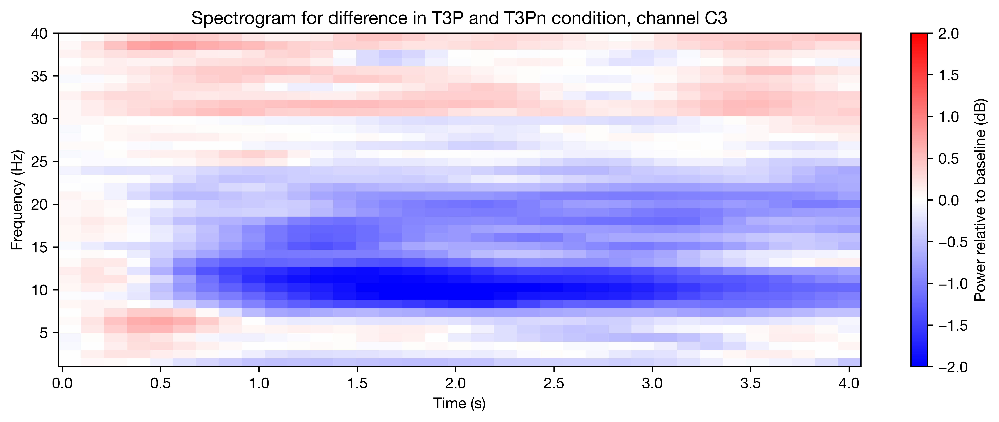

In [26]:
plot_spectrogram(list(spectrogram.values())[1] - list(spectrogram.values())[3])

In [49]:
def plot_TF(dict, mean = False, window = 1, overlay = True): 
    """ Takes a dict where each value should be of size (n_segments, n_channels), \\
    and returns frequency over time plots in a (n_items, 2) grid"""
    times = np.linspace(-0.5, 5.5, len(next(iter(dict.values()))[0])) #+  window*sfreq/2/len(next(iter(dict.values()))[0]) # Create time points equal to powers
    
    if overlay: 
        fig, ax = plt.subplots(1,1, figsize= (12,6))
    else: 
        fig, axes = plt.subplots(roof(len(dict)/2), 2, figsize=(12, len(dict)*2), constrained_layout = True)
        axes = axes.flatten()
    
    
    for i, (data_label, powers) in enumerate(dict.items()):
        if not overlay:
            ax = axes[i]
        if mean: # Plot mean with std
            mean_line = np.mean(powers, axis = 0)
            peak_ERD = min(mean_line)
            std_line = np.std(powers, axis = 0)/np.sqrt(len(powers))
            ax.plot(times, mean_line, label = data_label + f'.  Peak ERD: {round((1-peak_ERD)*100,1)}%')
            ax.fill_between(times, mean_line - std_line, mean_line + std_line, alpha=0.3)
            ax.axhline(y=peak_ERD, color=['green', 'orange', 'blue', 'pink'][i], linestyle='--', alpha = 0.7) # plot baseline
        
        else: # Plot each participant
            for power in powers:
                ax.plot(times, power, alpha = 0.5)
        if not overlay: 
            ax.axhline(y=1, color='black', linestyle='--', label='baseline', alpha = 0.3) # plot baseline
            ax.set_title(f"{data_label}")
            ax.set_ylim(0.55,1.35)
            ax.set_xlim(-0.1,4)
            ax.set_xlabel('Time (s)')
            ax.set_ylabel('Power')
    if overlay:
        ax.axhline(y=1, color='black', linestyle='--', label='baseline', alpha = 0.3) # plot baseline
        ax.set_title("ERD/S visualization")
        # ax.set_ylim(0.50,1.35)
        ax.set_xlim(-0.1,4)
        ax.set_xlabel('Time (s)')
        ax.set_ylabel('Power')
        ax.legend()
    plt.show()

In [41]:
window = 1
channel = 'C3'
settings = ['T1P', 'T1Pn']
overlap = 0.9
psds = get_psds_for_channel_for_all_participants(participants_data=epochs_df['Epochs'], overlap=overlap, channel=channel, settings=settings, freq_band = "Alpha", window=window)

For condition: T1P, for channel: C3 with freq band: Alpha:   0%|          | 0/92 [00:00<?, ?it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: Alpha:   0%|          | 0/92 [00:01<?, ?it/s]


KeyboardInterrupt: 

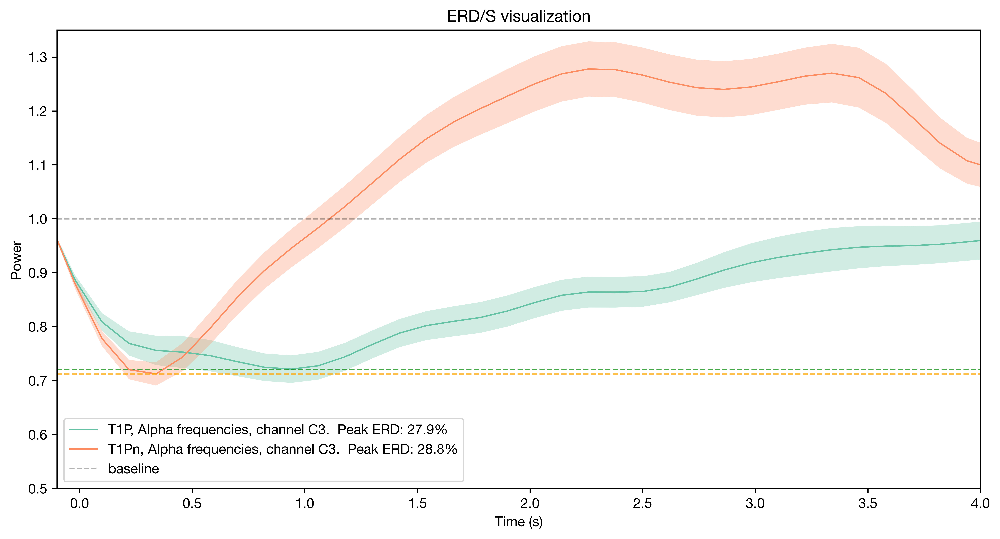

In [13]:
plot_TF(psds, mean=True)

In [51]:
overlap = 0.9
settings = ['T1P', 'T1Pn', 'T3P', 'T3Pn']
channel = 'C3'
Alpha_psds = get_psds_for_channel(participants_data=epochs_df['Epochs'], channel=channel, settings=settings, band = [8,12], window=3/8, overlap = overlap)
Beta_psds = get_psds_for_channel(participants_data=epochs_df['Epochs'], channel=channel, settings=settings, band = [12,35], window=3/12, overlap = overlap)
Theta_psds = get_psds_for_channel(participants_data=epochs_df['Epochs'], channel=channel, settings=settings, band = [4,8], window=3/4, overlap = overlap)
unfiltered_psds = get_psds_for_channel(participants_data=epochs_df['Epochs'], channel=channel, settings=settings, window=1, overlap = overlap)

For condition: T1P, for channel: C3 with freq band: [8, 12]:   0%|          | 0/92 [00:00<?, ?it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:   1%|          | 1/92 [00:00<01:00,  1.51it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:   2%|▏         | 2/92 [00:01<00:47,  1.90it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:   3%|▎         | 3/92 [00:01<00:43,  2.03it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:   4%|▍         | 4/92 [00:02<00:44,  2.00it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:   5%|▌         | 5/92 [00:02<00:44,  1.94it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:   7%|▋         | 6/92 [00:03<00:47,  1.83it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:   8%|▊         | 7/92 [00:03<00:43,  1.96it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:   9%|▊         | 8/92 [00:04<00:40,  2.06it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  10%|▉         | 9/92 [00:04<00:38,  2.15it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  11%|█         | 10/92 [00:04<00:37,  2.20it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  12%|█▏        | 11/92 [00:05<00:35,  2.27it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  13%|█▎        | 12/92 [00:05<00:34,  2.31it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  14%|█▍        | 13/92 [00:06<00:34,  2.30it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  15%|█▌        | 14/92 [00:06<00:34,  2.24it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  16%|█▋        | 15/92 [00:07<00:34,  2.25it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  17%|█▋        | 16/92 [00:07<00:33,  2.24it/s]

Loading data for 293 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  18%|█▊        | 17/92 [00:07<00:32,  2.29it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  20%|█▉        | 18/92 [00:08<00:32,  2.28it/s]

Loading data for 291 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  21%|██        | 19/92 [00:08<00:31,  2.31it/s]

Loading data for 284 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  22%|██▏       | 20/92 [00:09<00:31,  2.32it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  23%|██▎       | 21/92 [00:09<00:30,  2.31it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  24%|██▍       | 22/92 [00:10<00:31,  2.23it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  25%|██▌       | 23/92 [00:10<00:33,  2.08it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  26%|██▌       | 24/92 [00:11<00:32,  2.11it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  27%|██▋       | 25/92 [00:11<00:31,  2.14it/s]

Loading data for 292 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  28%|██▊       | 26/92 [00:12<00:30,  2.20it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  29%|██▉       | 27/92 [00:12<00:29,  2.22it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  30%|███       | 28/92 [00:12<00:28,  2.22it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  32%|███▏      | 29/92 [00:13<00:28,  2.24it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  33%|███▎      | 30/92 [00:13<00:27,  2.27it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  34%|███▎      | 31/92 [00:14<00:26,  2.26it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  35%|███▍      | 32/92 [00:14<00:26,  2.26it/s]

Loading data for 279 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  36%|███▌      | 33/92 [00:15<00:25,  2.31it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  37%|███▋      | 34/92 [00:15<00:25,  2.25it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  38%|███▊      | 35/92 [00:16<00:25,  2.27it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  39%|███▉      | 36/92 [00:16<00:24,  2.29it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  40%|████      | 37/92 [00:16<00:23,  2.30it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  41%|████▏     | 38/92 [00:17<00:23,  2.30it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  42%|████▏     | 39/92 [00:17<00:22,  2.33it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  43%|████▎     | 40/92 [00:18<00:22,  2.32it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  45%|████▍     | 41/92 [00:18<00:21,  2.33it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  46%|████▌     | 42/92 [00:19<00:22,  2.27it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  47%|████▋     | 43/92 [00:19<00:21,  2.28it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  48%|████▊     | 44/92 [00:19<00:21,  2.27it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  49%|████▉     | 45/92 [00:20<00:20,  2.31it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  50%|█████     | 46/92 [00:20<00:19,  2.35it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  51%|█████     | 47/92 [00:21<00:19,  2.36it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  52%|█████▏    | 48/92 [00:21<00:18,  2.35it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  53%|█████▎    | 49/92 [00:22<00:18,  2.34it/s]

Loading data for 290 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  54%|█████▍    | 50/92 [00:22<00:17,  2.37it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  55%|█████▌    | 51/92 [00:22<00:17,  2.35it/s]

Loading data for 293 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  57%|█████▋    | 52/92 [00:23<00:17,  2.35it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  58%|█████▊    | 53/92 [00:23<00:16,  2.33it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  59%|█████▊    | 54/92 [00:24<00:16,  2.37it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  60%|█████▉    | 55/92 [00:24<00:15,  2.39it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  61%|██████    | 56/92 [00:24<00:15,  2.40it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  62%|██████▏   | 57/92 [00:25<00:16,  2.16it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  63%|██████▎   | 58/92 [00:26<00:15,  2.14it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  64%|██████▍   | 59/92 [00:26<00:15,  2.16it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  65%|██████▌   | 60/92 [00:26<00:14,  2.20it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  66%|██████▋   | 61/92 [00:27<00:14,  2.20it/s]

Loading data for 290 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  67%|██████▋   | 62/92 [00:27<00:13,  2.24it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  68%|██████▊   | 63/92 [00:28<00:14,  2.07it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  70%|██████▉   | 64/92 [00:28<00:13,  2.01it/s]

Loading data for 282 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  71%|███████   | 65/92 [00:29<00:12,  2.09it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  72%|███████▏  | 66/92 [00:29<00:13,  1.91it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  73%|███████▎  | 67/92 [00:30<00:12,  2.03it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  74%|███████▍  | 68/92 [00:30<00:11,  2.10it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  75%|███████▌  | 69/92 [00:31<00:11,  2.08it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  76%|███████▌  | 70/92 [00:31<00:10,  2.09it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  77%|███████▋  | 71/92 [00:32<00:09,  2.13it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  78%|███████▊  | 72/92 [00:32<00:09,  2.16it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  79%|███████▉  | 73/92 [00:33<00:08,  2.19it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  80%|████████  | 74/92 [00:33<00:08,  2.22it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  82%|████████▏ | 75/92 [00:34<00:08,  2.10it/s]

Loading data for 274 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  83%|████████▎ | 76/92 [00:34<00:07,  2.18it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  84%|████████▎ | 77/92 [00:34<00:06,  2.18it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  85%|████████▍ | 78/92 [00:35<00:06,  2.18it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  86%|████████▌ | 79/92 [00:35<00:06,  2.16it/s]

Loading data for 275 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  87%|████████▋ | 80/92 [00:36<00:05,  2.22it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  88%|████████▊ | 81/92 [00:36<00:05,  1.96it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  89%|████████▉ | 82/92 [00:37<00:05,  1.91it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  90%|█████████ | 83/92 [00:38<00:04,  1.96it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  91%|█████████▏| 84/92 [00:38<00:04,  1.91it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  92%|█████████▏| 85/92 [00:39<00:03,  1.98it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  93%|█████████▎| 86/92 [00:39<00:03,  1.97it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  95%|█████████▍| 87/92 [00:40<00:02,  1.97it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  96%|█████████▌| 88/92 [00:40<00:02,  2.00it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  97%|█████████▋| 89/92 [00:41<00:01,  1.79it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  98%|█████████▊| 90/92 [00:41<00:01,  1.91it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  99%|█████████▉| 91/92 [00:42<00:00,  1.68it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]: 100%|██████████| 92/92 [00:42<00:00,  2.15it/s]
For condition: T1Pn, for channel: C3 with freq band: [8, 12]:   0%|          | 0/92 [00:00<?, ?it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:   1%|          | 1/92 [00:00<01:06,  1.36it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:   2%|▏         | 2/92 [00:01<00:50,  1.79it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:   3%|▎         | 3/92 [00:01<00:59,  1.50it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:   4%|▍         | 4/92 [00:02<00:54,  1.62it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:   5%|▌         | 5/92 [00:03<00:51,  1.70it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:   7%|▋         | 6/92 [00:03<00:46,  1.84it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:   8%|▊         | 7/92 [00:03<00:42,  1.98it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:   9%|▊         | 8/92 [00:04<00:41,  2.05it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  10%|▉         | 9/92 [00:04<00:40,  2.07it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  11%|█         | 10/92 [00:05<00:41,  1.99it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  12%|█▏        | 11/92 [00:05<00:40,  2.01it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  13%|█▎        | 12/92 [00:06<00:41,  1.92it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  14%|█▍        | 13/92 [00:07<00:45,  1.74it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  15%|█▌        | 14/92 [00:07<00:46,  1.69it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  16%|█▋        | 15/92 [00:08<00:42,  1.83it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  17%|█▋        | 16/92 [00:08<00:39,  1.92it/s]

Loading data for 293 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  18%|█▊        | 17/92 [00:09<00:37,  2.02it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  20%|█▉        | 18/92 [00:09<00:35,  2.09it/s]

Loading data for 291 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  21%|██        | 19/92 [00:09<00:34,  2.15it/s]

Loading data for 284 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  22%|██▏       | 20/92 [00:10<00:34,  2.11it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  23%|██▎       | 21/92 [00:10<00:33,  2.12it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  24%|██▍       | 22/92 [00:11<00:32,  2.15it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  25%|██▌       | 23/92 [00:11<00:31,  2.21it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  26%|██▌       | 24/92 [00:12<00:31,  2.15it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  27%|██▋       | 25/92 [00:12<00:31,  2.14it/s]

Loading data for 292 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  28%|██▊       | 26/92 [00:13<00:31,  2.08it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  29%|██▉       | 27/92 [00:13<00:30,  2.13it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  30%|███       | 28/92 [00:14<00:29,  2.15it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  32%|███▏      | 29/92 [00:14<00:28,  2.20it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  33%|███▎      | 30/92 [00:15<00:27,  2.23it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  34%|███▎      | 31/92 [00:15<00:27,  2.21it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  35%|███▍      | 32/92 [00:15<00:26,  2.26it/s]

Loading data for 279 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  36%|███▌      | 33/92 [00:16<00:27,  2.11it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  37%|███▋      | 34/92 [00:16<00:27,  2.13it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  38%|███▊      | 35/92 [00:17<00:26,  2.17it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  39%|███▉      | 36/92 [00:17<00:25,  2.23it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  40%|████      | 37/92 [00:18<00:24,  2.24it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  41%|████▏     | 38/92 [00:18<00:23,  2.28it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  42%|████▏     | 39/92 [00:19<00:23,  2.29it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  43%|████▎     | 40/92 [00:19<00:22,  2.28it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  45%|████▍     | 41/92 [00:20<00:22,  2.25it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  46%|████▌     | 42/92 [00:20<00:22,  2.24it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  47%|████▋     | 43/92 [00:21<00:23,  2.07it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  48%|████▊     | 44/92 [00:21<00:23,  2.09it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  49%|████▉     | 45/92 [00:21<00:22,  2.13it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  50%|█████     | 46/92 [00:22<00:21,  2.19it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  51%|█████     | 47/92 [00:22<00:20,  2.23it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  52%|█████▏    | 48/92 [00:23<00:19,  2.27it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  53%|█████▎    | 49/92 [00:23<00:18,  2.30it/s]

Loading data for 290 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  54%|█████▍    | 50/92 [00:24<00:18,  2.32it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  55%|█████▌    | 51/92 [00:24<00:18,  2.25it/s]

Loading data for 293 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  57%|█████▋    | 52/92 [00:24<00:17,  2.30it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  58%|█████▊    | 53/92 [00:25<00:16,  2.33it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  59%|█████▊    | 54/92 [00:25<00:15,  2.38it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  60%|█████▉    | 55/92 [00:26<00:15,  2.33it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  61%|██████    | 56/92 [00:26<00:15,  2.31it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  62%|██████▏   | 57/92 [00:27<00:15,  2.33it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  63%|██████▎   | 58/92 [00:27<00:14,  2.32it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  64%|██████▍   | 59/92 [00:27<00:14,  2.33it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  65%|██████▌   | 60/92 [00:28<00:13,  2.31it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  66%|██████▋   | 61/92 [00:28<00:13,  2.33it/s]

Loading data for 290 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  67%|██████▋   | 62/92 [00:29<00:12,  2.33it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  68%|██████▊   | 63/92 [00:29<00:12,  2.32it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  70%|██████▉   | 64/92 [00:30<00:12,  2.20it/s]

Loading data for 282 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  71%|███████   | 65/92 [00:30<00:12,  2.18it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  72%|███████▏  | 66/92 [00:31<00:11,  2.18it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  73%|███████▎  | 67/92 [00:31<00:12,  1.99it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  74%|███████▍  | 68/92 [00:32<00:11,  2.07it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  75%|███████▌  | 69/92 [00:32<00:10,  2.12it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  76%|███████▌  | 70/92 [00:33<00:10,  2.17it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  77%|███████▋  | 71/92 [00:33<00:09,  2.23it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  78%|███████▊  | 72/92 [00:33<00:08,  2.23it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  79%|███████▉  | 73/92 [00:34<00:08,  2.20it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  80%|████████  | 74/92 [00:34<00:08,  2.24it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  82%|████████▏ | 75/92 [00:35<00:07,  2.25it/s]

Loading data for 274 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  83%|████████▎ | 76/92 [00:35<00:07,  2.29it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  84%|████████▎ | 77/92 [00:36<00:06,  2.31it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  85%|████████▍ | 78/92 [00:36<00:06,  2.33it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  86%|████████▌ | 79/92 [00:36<00:05,  2.26it/s]

Loading data for 275 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  87%|████████▋ | 80/92 [00:37<00:05,  2.33it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  88%|████████▊ | 81/92 [00:37<00:04,  2.35it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  89%|████████▉ | 82/92 [00:38<00:04,  2.32it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  90%|█████████ | 83/92 [00:38<00:03,  2.26it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  91%|█████████▏| 84/92 [00:39<00:03,  2.25it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  92%|█████████▏| 85/92 [00:39<00:03,  2.27it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  93%|█████████▎| 86/92 [00:40<00:02,  2.30it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  95%|█████████▍| 87/92 [00:40<00:02,  2.30it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  96%|█████████▌| 88/92 [00:40<00:01,  2.30it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  97%|█████████▋| 89/92 [00:41<00:01,  2.24it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  98%|█████████▊| 90/92 [00:41<00:00,  2.22it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]:  99%|█████████▉| 91/92 [00:42<00:00,  2.21it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [8, 12]: 100%|██████████| 92/92 [00:42<00:00,  2.15it/s]
For condition: T3P, for channel: C3 with freq band: [8, 12]:   0%|          | 0/92 [00:00<?, ?it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:   1%|          | 1/92 [00:00<00:46,  1.97it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:   2%|▏         | 2/92 [00:00<00:44,  2.03it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:   3%|▎         | 3/92 [00:01<00:44,  1.99it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:   4%|▍         | 4/92 [00:01<00:41,  2.14it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:   5%|▌         | 5/92 [00:02<00:39,  2.21it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:   7%|▋         | 6/92 [00:02<00:38,  2.24it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:   8%|▊         | 7/92 [00:03<00:37,  2.27it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:   9%|▊         | 8/92 [00:03<00:36,  2.29it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  10%|▉         | 9/92 [00:04<00:36,  2.28it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  11%|█         | 10/92 [00:04<00:36,  2.26it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  12%|█▏        | 11/92 [00:04<00:36,  2.22it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  13%|█▎        | 12/92 [00:05<00:35,  2.24it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  14%|█▍        | 13/92 [00:05<00:35,  2.24it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  15%|█▌        | 14/92 [00:06<00:34,  2.28it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  16%|█▋        | 15/92 [00:06<00:33,  2.27it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  17%|█▋        | 16/92 [00:07<00:33,  2.29it/s]

Loading data for 293 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  18%|█▊        | 17/92 [00:07<00:32,  2.33it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  20%|█▉        | 18/92 [00:08<00:31,  2.34it/s]

Loading data for 291 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  21%|██        | 19/92 [00:08<00:30,  2.36it/s]

Loading data for 284 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  22%|██▏       | 20/92 [00:08<00:30,  2.35it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  23%|██▎       | 21/92 [00:09<00:33,  2.13it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  24%|██▍       | 22/92 [00:09<00:32,  2.18it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  25%|██▌       | 23/92 [00:10<00:31,  2.22it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  26%|██▌       | 24/92 [00:10<00:33,  2.03it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  27%|██▋       | 25/92 [00:11<00:31,  2.12it/s]

Loading data for 292 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  28%|██▊       | 26/92 [00:11<00:30,  2.14it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  29%|██▉       | 27/92 [00:12<00:30,  2.15it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  30%|███       | 28/92 [00:12<00:31,  2.06it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  32%|███▏      | 29/92 [00:13<00:30,  2.05it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  33%|███▎      | 30/92 [00:13<00:34,  1.82it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  34%|███▎      | 31/92 [00:14<00:32,  1.86it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  35%|███▍      | 32/92 [00:14<00:31,  1.89it/s]

Loading data for 279 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  36%|███▌      | 33/92 [00:15<00:30,  1.95it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  37%|███▋      | 34/92 [00:15<00:29,  1.97it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  38%|███▊      | 35/92 [00:16<00:28,  2.01it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  39%|███▉      | 36/92 [00:16<00:28,  1.95it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  40%|████      | 37/92 [00:17<00:28,  1.91it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  41%|████▏     | 38/92 [00:17<00:27,  1.97it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  42%|████▏     | 39/92 [00:18<00:27,  1.96it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  43%|████▎     | 40/92 [00:18<00:25,  2.04it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  45%|████▍     | 41/92 [00:19<00:24,  2.11it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  46%|████▌     | 42/92 [00:19<00:25,  1.98it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  47%|████▋     | 43/92 [00:20<00:24,  1.97it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  48%|████▊     | 44/92 [00:20<00:23,  2.07it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  49%|████▉     | 45/92 [00:21<00:23,  2.04it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  50%|█████     | 46/92 [00:21<00:21,  2.15it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  51%|█████     | 47/92 [00:22<00:20,  2.22it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  52%|█████▏    | 48/92 [00:22<00:19,  2.29it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  53%|█████▎    | 49/92 [00:23<00:18,  2.35it/s]

Loading data for 290 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  54%|█████▍    | 50/92 [00:23<00:17,  2.41it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  55%|█████▌    | 51/92 [00:23<00:16,  2.41it/s]

Loading data for 293 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  57%|█████▋    | 52/92 [00:24<00:16,  2.37it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  58%|█████▊    | 53/92 [00:24<00:16,  2.36it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  59%|█████▊    | 54/92 [00:25<00:16,  2.35it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  60%|█████▉    | 55/92 [00:25<00:16,  2.30it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  61%|██████    | 56/92 [00:26<00:15,  2.30it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  62%|██████▏   | 57/92 [00:26<00:16,  2.18it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  63%|██████▎   | 58/92 [00:26<00:15,  2.19it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  64%|██████▍   | 59/92 [00:27<00:14,  2.24it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  65%|██████▌   | 60/92 [00:27<00:14,  2.27it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  66%|██████▋   | 61/92 [00:28<00:13,  2.26it/s]

Loading data for 290 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  67%|██████▋   | 62/92 [00:28<00:12,  2.32it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  68%|██████▊   | 63/92 [00:29<00:12,  2.30it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  70%|██████▉   | 64/92 [00:29<00:12,  2.24it/s]

Loading data for 282 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  71%|███████   | 65/92 [00:30<00:11,  2.30it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  72%|███████▏  | 66/92 [00:30<00:11,  2.32it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  73%|███████▎  | 67/92 [00:30<00:10,  2.33it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  74%|███████▍  | 68/92 [00:31<00:10,  2.33it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  75%|███████▌  | 69/92 [00:31<00:10,  2.29it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  76%|███████▌  | 70/92 [00:32<00:09,  2.32it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  77%|███████▋  | 71/92 [00:32<00:09,  2.31it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  78%|███████▊  | 72/92 [00:33<00:08,  2.34it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  79%|███████▉  | 73/92 [00:33<00:08,  2.36it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  80%|████████  | 74/92 [00:33<00:07,  2.39it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  82%|████████▏ | 75/92 [00:34<00:07,  2.41it/s]

Loading data for 274 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  83%|████████▎ | 76/92 [00:34<00:06,  2.46it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  84%|████████▎ | 77/92 [00:35<00:06,  2.43it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  85%|████████▍ | 78/92 [00:35<00:05,  2.37it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  86%|████████▌ | 79/92 [00:35<00:05,  2.34it/s]

Loading data for 275 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  87%|████████▋ | 80/92 [00:36<00:04,  2.41it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  88%|████████▊ | 81/92 [00:36<00:04,  2.36it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  89%|████████▉ | 82/92 [00:37<00:04,  2.36it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  90%|█████████ | 83/92 [00:37<00:03,  2.28it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  91%|█████████▏| 84/92 [00:38<00:03,  2.19it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  92%|█████████▏| 85/92 [00:38<00:03,  2.20it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  93%|█████████▎| 86/92 [00:39<00:02,  2.24it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  95%|█████████▍| 87/92 [00:39<00:02,  2.17it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  96%|█████████▌| 88/92 [00:40<00:01,  2.11it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  97%|█████████▋| 89/92 [00:40<00:01,  2.15it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  98%|█████████▊| 90/92 [00:40<00:00,  2.18it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  99%|█████████▉| 91/92 [00:41<00:00,  2.09it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]: 100%|██████████| 92/92 [00:41<00:00,  2.19it/s]
For condition: T3Pn, for channel: C3 with freq band: [8, 12]:   0%|          | 0/92 [00:00<?, ?it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:   1%|          | 1/92 [00:00<00:39,  2.33it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:   2%|▏         | 2/92 [00:00<00:38,  2.34it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:   3%|▎         | 3/92 [00:01<00:38,  2.31it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:   4%|▍         | 4/92 [00:01<00:39,  2.25it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:   5%|▌         | 5/92 [00:02<00:37,  2.29it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:   7%|▋         | 6/92 [00:02<00:39,  2.20it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:   8%|▊         | 7/92 [00:03<00:37,  2.28it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:   9%|▊         | 8/92 [00:03<00:38,  2.21it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  10%|▉         | 9/92 [00:03<00:37,  2.23it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  11%|█         | 10/92 [00:04<00:35,  2.30it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  12%|█▏        | 11/92 [00:04<00:35,  2.29it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  13%|█▎        | 12/92 [00:05<00:34,  2.31it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  14%|█▍        | 13/92 [00:05<00:34,  2.30it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  15%|█▌        | 14/92 [00:06<00:33,  2.31it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  16%|█▋        | 15/92 [00:06<00:33,  2.32it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  17%|█▋        | 16/92 [00:06<00:32,  2.33it/s]

Loading data for 293 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  18%|█▊        | 17/92 [00:07<00:34,  2.19it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  20%|█▉        | 18/92 [00:07<00:34,  2.16it/s]

Loading data for 291 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  21%|██        | 19/92 [00:08<00:33,  2.19it/s]

Loading data for 284 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  22%|██▏       | 20/92 [00:08<00:32,  2.25it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  23%|██▎       | 21/92 [00:09<00:31,  2.26it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  24%|██▍       | 22/92 [00:09<00:30,  2.29it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  25%|██▌       | 23/92 [00:10<00:29,  2.33it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  26%|██▌       | 24/92 [00:10<00:29,  2.32it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  27%|██▋       | 25/92 [00:10<00:28,  2.31it/s]

Loading data for 292 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  28%|██▊       | 26/92 [00:11<00:29,  2.26it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  29%|██▉       | 27/92 [00:11<00:28,  2.29it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  30%|███       | 28/92 [00:12<00:27,  2.32it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  32%|███▏      | 29/92 [00:12<00:27,  2.31it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  33%|███▎      | 30/92 [00:13<00:26,  2.35it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  34%|███▎      | 31/92 [00:14<00:34,  1.79it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  35%|███▍      | 32/92 [00:14<00:33,  1.79it/s]

Loading data for 279 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  36%|███▌      | 33/92 [00:15<00:36,  1.61it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  37%|███▋      | 34/92 [00:15<00:33,  1.73it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  38%|███▊      | 35/92 [00:16<00:30,  1.89it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  39%|███▉      | 36/92 [00:16<00:29,  1.93it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  40%|████      | 37/92 [00:17<00:26,  2.05it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  41%|████▏     | 38/92 [00:17<00:25,  2.14it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  42%|████▏     | 39/92 [00:18<00:24,  2.15it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  43%|████▎     | 40/92 [00:18<00:23,  2.20it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  45%|████▍     | 41/92 [00:18<00:22,  2.23it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  46%|████▌     | 42/92 [00:19<00:22,  2.26it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  47%|████▋     | 43/92 [00:19<00:21,  2.27it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  48%|████▊     | 44/92 [00:20<00:20,  2.29it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  49%|████▉     | 45/92 [00:20<00:20,  2.29it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  50%|█████     | 46/92 [00:21<00:19,  2.32it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  51%|█████     | 47/92 [00:21<00:20,  2.21it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  52%|█████▏    | 48/92 [00:22<00:20,  2.15it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  53%|█████▎    | 49/92 [00:22<00:21,  2.04it/s]

Loading data for 290 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  54%|█████▍    | 50/92 [00:22<00:19,  2.12it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  55%|█████▌    | 51/92 [00:24<00:32,  1.28it/s]

Loading data for 293 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  57%|█████▋    | 52/92 [00:25<00:27,  1.43it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  58%|█████▊    | 53/92 [00:25<00:26,  1.50it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  59%|█████▊    | 54/92 [00:26<00:22,  1.67it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  60%|█████▉    | 55/92 [00:26<00:21,  1.70it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  61%|██████    | 56/92 [00:27<00:21,  1.70it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  62%|██████▏   | 57/92 [00:27<00:21,  1.64it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  63%|██████▎   | 58/92 [00:28<00:19,  1.73it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  64%|██████▍   | 59/92 [00:28<00:17,  1.89it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  65%|██████▌   | 60/92 [00:29<00:18,  1.72it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  66%|██████▋   | 61/92 [00:29<00:17,  1.78it/s]

Loading data for 290 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  67%|██████▋   | 62/92 [00:30<00:16,  1.87it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  68%|██████▊   | 63/92 [00:30<00:14,  1.97it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  70%|██████▉   | 64/92 [00:31<00:13,  2.04it/s]

Loading data for 282 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  71%|███████   | 65/92 [00:31<00:12,  2.11it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  72%|███████▏  | 66/92 [00:32<00:12,  2.15it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  73%|███████▎  | 67/92 [00:32<00:11,  2.14it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  74%|███████▍  | 68/92 [00:33<00:11,  2.07it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  75%|███████▌  | 69/92 [00:33<00:11,  1.97it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  76%|███████▌  | 70/92 [00:34<00:10,  2.03it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  77%|███████▋  | 71/92 [00:34<00:10,  2.10it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  78%|███████▊  | 72/92 [00:35<00:09,  2.16it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  79%|███████▉  | 73/92 [00:35<00:08,  2.20it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  80%|████████  | 74/92 [00:35<00:08,  2.23it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  82%|████████▏ | 75/92 [00:36<00:07,  2.25it/s]

Loading data for 274 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  83%|████████▎ | 76/92 [00:36<00:06,  2.29it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  84%|████████▎ | 77/92 [00:37<00:06,  2.28it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  85%|████████▍ | 78/92 [00:37<00:06,  2.26it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  86%|████████▌ | 79/92 [00:38<00:05,  2.28it/s]

Loading data for 275 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  87%|████████▋ | 80/92 [00:38<00:05,  2.27it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  88%|████████▊ | 81/92 [00:39<00:04,  2.22it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  89%|████████▉ | 82/92 [00:40<00:06,  1.54it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  90%|█████████ | 83/92 [00:40<00:05,  1.64it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  91%|█████████▏| 84/92 [00:41<00:04,  1.79it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  92%|█████████▏| 85/92 [00:41<00:03,  1.90it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  93%|█████████▎| 86/92 [00:42<00:02,  2.03it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  95%|█████████▍| 87/92 [00:42<00:02,  2.10it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  96%|█████████▌| 88/92 [00:42<00:01,  2.16it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  97%|█████████▋| 89/92 [00:43<00:01,  2.16it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  98%|█████████▊| 90/92 [00:43<00:00,  2.15it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]:  99%|█████████▉| 91/92 [00:44<00:00,  2.15it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [8, 12]: 100%|██████████| 92/92 [00:44<00:00,  2.06it/s]
For condition: T1P, for channel: C3 with freq band: [12, 35]:   0%|          | 0/92 [00:00<?, ?it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:   1%|          | 1/92 [00:00<00:38,  2.36it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:   2%|▏         | 2/92 [00:00<00:39,  2.27it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:   3%|▎         | 3/92 [00:01<00:39,  2.26it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:   4%|▍         | 4/92 [00:01<00:38,  2.30it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:   5%|▌         | 5/92 [00:02<00:37,  2.31it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:   7%|▋         | 6/92 [00:02<00:40,  2.15it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:   8%|▊         | 7/92 [00:03<00:41,  2.04it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:   9%|▊         | 8/92 [00:03<00:40,  2.07it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  10%|▉         | 9/92 [00:04<00:43,  1.92it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  11%|█         | 10/92 [00:04<00:41,  1.96it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  12%|█▏        | 11/92 [00:05<00:43,  1.88it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  13%|█▎        | 12/92 [00:06<00:45,  1.76it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  14%|█▍        | 13/92 [00:06<00:42,  1.87it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  15%|█▌        | 14/92 [00:07<00:45,  1.72it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  16%|█▋        | 15/92 [00:07<00:43,  1.78it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  17%|█▋        | 16/92 [00:08<00:40,  1.88it/s]

Loading data for 293 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  18%|█▊        | 17/92 [00:08<00:37,  2.00it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  20%|█▉        | 18/92 [00:09<00:36,  2.05it/s]

Loading data for 291 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  21%|██        | 19/92 [00:09<00:34,  2.10it/s]

Loading data for 284 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  22%|██▏       | 20/92 [00:09<00:34,  2.09it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  23%|██▎       | 21/92 [00:10<00:33,  2.12it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  24%|██▍       | 22/92 [00:10<00:33,  2.11it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  25%|██▌       | 23/92 [00:11<00:32,  2.11it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  26%|██▌       | 24/92 [00:11<00:32,  2.07it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  27%|██▋       | 25/92 [00:12<00:32,  2.03it/s]

Loading data for 292 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  28%|██▊       | 26/92 [00:12<00:33,  1.99it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  29%|██▉       | 27/92 [00:13<00:32,  2.01it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  30%|███       | 28/92 [00:14<00:33,  1.91it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  32%|███▏      | 29/92 [00:14<00:31,  2.02it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  33%|███▎      | 30/92 [00:14<00:30,  2.05it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  34%|███▎      | 31/92 [00:15<00:28,  2.11it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  35%|███▍      | 32/92 [00:15<00:28,  2.13it/s]

Loading data for 279 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  36%|███▌      | 33/92 [00:16<00:26,  2.19it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  37%|███▋      | 34/92 [00:16<00:26,  2.17it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  38%|███▊      | 35/92 [00:17<00:25,  2.20it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  39%|███▉      | 36/92 [00:17<00:26,  2.15it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  40%|████      | 37/92 [00:18<00:26,  2.10it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  41%|████▏     | 38/92 [00:18<00:28,  1.92it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  42%|████▏     | 39/92 [00:19<00:26,  1.96it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  43%|████▎     | 40/92 [00:19<00:25,  2.05it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  45%|████▍     | 41/92 [00:20<00:24,  2.10it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  46%|████▌     | 42/92 [00:20<00:24,  2.05it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  47%|████▋     | 43/92 [00:21<00:23,  2.10it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  48%|████▊     | 44/92 [00:21<00:22,  2.15it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  49%|████▉     | 45/92 [00:21<00:21,  2.19it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  50%|█████     | 46/92 [00:22<00:20,  2.24it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  51%|█████     | 47/92 [00:22<00:19,  2.25it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  52%|█████▏    | 48/92 [00:23<00:19,  2.26it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  53%|█████▎    | 49/92 [00:23<00:18,  2.30it/s]

Loading data for 290 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  54%|█████▍    | 50/92 [00:24<00:18,  2.33it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  55%|█████▌    | 51/92 [00:24<00:19,  2.08it/s]

Loading data for 293 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  57%|█████▋    | 52/92 [00:25<00:20,  1.98it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  58%|█████▊    | 53/92 [00:25<00:19,  1.98it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  59%|█████▊    | 54/92 [00:26<00:18,  2.00it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  60%|█████▉    | 55/92 [00:26<00:17,  2.07it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  61%|██████    | 56/92 [00:27<00:16,  2.14it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  62%|██████▏   | 57/92 [00:27<00:16,  2.17it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  63%|██████▎   | 58/92 [00:28<00:15,  2.18it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  64%|██████▍   | 59/92 [00:28<00:14,  2.22it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  65%|██████▌   | 60/92 [00:28<00:14,  2.23it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  66%|██████▋   | 61/92 [00:29<00:14,  2.16it/s]

Loading data for 290 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  67%|██████▋   | 62/92 [00:29<00:14,  2.05it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  68%|██████▊   | 63/92 [00:30<00:13,  2.08it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  70%|██████▉   | 64/92 [00:30<00:13,  2.12it/s]

Loading data for 282 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  71%|███████   | 65/92 [00:31<00:12,  2.17it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  72%|███████▏  | 66/92 [00:31<00:11,  2.19it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  73%|███████▎  | 67/92 [00:32<00:11,  2.23it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  74%|███████▍  | 68/92 [00:32<00:10,  2.26it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  75%|███████▌  | 69/92 [00:33<00:10,  2.24it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  76%|███████▌  | 70/92 [00:33<00:09,  2.26it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  77%|███████▋  | 71/92 [00:33<00:09,  2.20it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  78%|███████▊  | 72/92 [00:34<00:08,  2.26it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  79%|███████▉  | 73/92 [00:34<00:08,  2.28it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  80%|████████  | 74/92 [00:35<00:07,  2.29it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  82%|████████▏ | 75/92 [00:35<00:07,  2.21it/s]

Loading data for 274 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  83%|████████▎ | 76/92 [00:36<00:07,  2.24it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  84%|████████▎ | 77/92 [00:36<00:06,  2.19it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  85%|████████▍ | 78/92 [00:37<00:06,  2.23it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  86%|████████▌ | 79/92 [00:37<00:05,  2.25it/s]

Loading data for 275 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  87%|████████▋ | 80/92 [00:37<00:05,  2.23it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  88%|████████▊ | 81/92 [00:38<00:04,  2.23it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  89%|████████▉ | 82/92 [00:38<00:04,  2.21it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  90%|█████████ | 83/92 [00:39<00:04,  2.12it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  91%|█████████▏| 84/92 [00:39<00:03,  2.19it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  92%|█████████▏| 85/92 [00:40<00:03,  2.03it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  93%|█████████▎| 86/92 [00:40<00:02,  2.09it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  95%|█████████▍| 87/92 [00:41<00:02,  2.08it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  96%|█████████▌| 88/92 [00:41<00:01,  2.10it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  97%|█████████▋| 89/92 [00:42<00:01,  2.03it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  98%|█████████▊| 90/92 [00:42<00:00,  2.10it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]:  99%|█████████▉| 91/92 [00:43<00:00,  2.13it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [12, 35]: 100%|██████████| 92/92 [00:43<00:00,  2.11it/s]
For condition: T1Pn, for channel: C3 with freq band: [12, 35]:   0%|          | 0/92 [00:00<?, ?it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:   1%|          | 1/92 [00:00<00:39,  2.31it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:   2%|▏         | 2/92 [00:00<00:45,  1.98it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:   3%|▎         | 3/92 [00:01<00:42,  2.09it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:   4%|▍         | 4/92 [00:01<00:41,  2.15it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:   5%|▌         | 5/92 [00:02<00:39,  2.22it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:   7%|▋         | 6/92 [00:02<00:37,  2.27it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:   8%|▊         | 7/92 [00:03<00:39,  2.17it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:   9%|▊         | 8/92 [00:03<00:38,  2.18it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  10%|▉         | 9/92 [00:04<00:37,  2.20it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  11%|█         | 10/92 [00:04<00:36,  2.27it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  12%|█▏        | 11/92 [00:04<00:35,  2.31it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  13%|█▎        | 12/92 [00:05<00:34,  2.33it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  14%|█▍        | 13/92 [00:05<00:33,  2.34it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  15%|█▌        | 14/92 [00:06<00:33,  2.30it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  16%|█▋        | 15/92 [00:06<00:35,  2.20it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  17%|█▋        | 16/92 [00:07<00:36,  2.09it/s]

Loading data for 293 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  18%|█▊        | 17/92 [00:07<00:35,  2.14it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  20%|█▉        | 18/92 [00:08<00:34,  2.15it/s]

Loading data for 291 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  21%|██        | 19/92 [00:08<00:32,  2.22it/s]

Loading data for 284 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  22%|██▏       | 20/92 [00:09<00:33,  2.17it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  23%|██▎       | 21/92 [00:09<00:32,  2.17it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  24%|██▍       | 22/92 [00:10<00:32,  2.18it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  25%|██▌       | 23/92 [00:10<00:31,  2.22it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  26%|██▌       | 24/92 [00:10<00:30,  2.25it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  27%|██▋       | 25/92 [00:11<00:29,  2.24it/s]

Loading data for 292 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  28%|██▊       | 26/92 [00:11<00:28,  2.29it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  29%|██▉       | 27/92 [00:12<00:28,  2.30it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  30%|███       | 28/92 [00:12<00:28,  2.28it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  32%|███▏      | 29/92 [00:13<00:27,  2.27it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  33%|███▎      | 30/92 [00:13<00:27,  2.28it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  34%|███▎      | 31/92 [00:13<00:26,  2.28it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  35%|███▍      | 32/92 [00:14<00:25,  2.31it/s]

Loading data for 279 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  36%|███▌      | 33/92 [00:14<00:25,  2.27it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  37%|███▋      | 34/92 [00:15<00:25,  2.24it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  38%|███▊      | 35/92 [00:15<00:26,  2.12it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  39%|███▉      | 36/92 [00:16<00:25,  2.15it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  40%|████      | 37/92 [00:16<00:25,  2.19it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  41%|████▏     | 38/92 [00:17<00:26,  2.05it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  42%|████▏     | 39/92 [00:17<00:25,  2.10it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  43%|████▎     | 40/92 [00:18<00:24,  2.15it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  45%|████▍     | 41/92 [00:18<00:23,  2.18it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  46%|████▌     | 42/92 [00:18<00:22,  2.22it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  47%|████▋     | 43/92 [00:19<00:21,  2.25it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  48%|████▊     | 44/92 [00:19<00:21,  2.25it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  49%|████▉     | 45/92 [00:20<00:20,  2.24it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  50%|█████     | 46/92 [00:20<00:20,  2.25it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  51%|█████     | 47/92 [00:21<00:19,  2.28it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  52%|█████▏    | 48/92 [00:21<00:18,  2.34it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  53%|█████▎    | 49/92 [00:22<00:18,  2.36it/s]

Loading data for 290 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  54%|█████▍    | 50/92 [00:22<00:17,  2.40it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  55%|█████▌    | 51/92 [00:22<00:17,  2.37it/s]

Loading data for 293 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  57%|█████▋    | 52/92 [00:23<00:16,  2.37it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  58%|█████▊    | 53/92 [00:23<00:16,  2.35it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  59%|█████▊    | 54/92 [00:24<00:16,  2.25it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  60%|█████▉    | 55/92 [00:24<00:16,  2.19it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  61%|██████    | 56/92 [00:25<00:16,  2.21it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  62%|██████▏   | 57/92 [00:25<00:15,  2.26it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  63%|██████▎   | 58/92 [00:25<00:14,  2.31it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  64%|██████▍   | 59/92 [00:26<00:14,  2.29it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  65%|██████▌   | 60/92 [00:26<00:13,  2.31it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  66%|██████▋   | 61/92 [00:27<00:13,  2.31it/s]

Loading data for 290 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  67%|██████▋   | 62/92 [00:27<00:13,  2.21it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  68%|██████▊   | 63/92 [00:28<00:13,  2.21it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  70%|██████▉   | 64/92 [00:28<00:12,  2.27it/s]

Loading data for 282 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  71%|███████   | 65/92 [00:29<00:11,  2.33it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  72%|███████▏  | 66/92 [00:29<00:11,  2.33it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  73%|███████▎  | 67/92 [00:29<00:11,  2.25it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  74%|███████▍  | 68/92 [00:30<00:10,  2.19it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  75%|███████▌  | 69/92 [00:30<00:10,  2.16it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  76%|███████▌  | 70/92 [00:31<00:10,  2.18it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  77%|███████▋  | 71/92 [00:31<00:09,  2.12it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  78%|███████▊  | 72/92 [00:32<00:09,  2.04it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  79%|███████▉  | 73/92 [00:32<00:09,  2.07it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  80%|████████  | 74/92 [00:33<00:08,  2.12it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  82%|████████▏ | 75/92 [00:33<00:07,  2.17it/s]

Loading data for 274 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  83%|████████▎ | 76/92 [00:34<00:07,  2.16it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  84%|████████▎ | 77/92 [00:34<00:06,  2.19it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  85%|████████▍ | 78/92 [00:35<00:06,  2.11it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  86%|████████▌ | 79/92 [00:35<00:06,  2.15it/s]

Loading data for 275 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  87%|████████▋ | 80/92 [00:35<00:05,  2.25it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  88%|████████▊ | 81/92 [00:36<00:04,  2.25it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  89%|████████▉ | 82/92 [00:36<00:04,  2.29it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  90%|█████████ | 83/92 [00:37<00:03,  2.30it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  91%|█████████▏| 84/92 [00:37<00:03,  2.21it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  92%|█████████▏| 85/92 [00:38<00:03,  2.25it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  93%|█████████▎| 86/92 [00:38<00:02,  2.28it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  95%|█████████▍| 87/92 [00:39<00:02,  2.32it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  96%|█████████▌| 88/92 [00:39<00:01,  2.30it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  97%|█████████▋| 89/92 [00:39<00:01,  2.28it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  98%|█████████▊| 90/92 [00:40<00:00,  2.24it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]:  99%|█████████▉| 91/92 [00:40<00:00,  2.21it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [12, 35]: 100%|██████████| 92/92 [00:41<00:00,  2.23it/s]
For condition: T3P, for channel: C3 with freq band: [12, 35]:   0%|          | 0/92 [00:00<?, ?it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:   1%|          | 1/92 [00:00<00:43,  2.08it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:   2%|▏         | 2/92 [00:00<00:43,  2.05it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:   3%|▎         | 3/92 [00:01<00:41,  2.15it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:   4%|▍         | 4/92 [00:01<00:41,  2.13it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:   5%|▌         | 5/92 [00:02<00:40,  2.15it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:   7%|▋         | 6/92 [00:02<00:39,  2.15it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:   8%|▊         | 7/92 [00:03<00:39,  2.17it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:   9%|▊         | 8/92 [00:03<00:43,  1.95it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  10%|▉         | 9/92 [00:04<00:40,  2.03it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  11%|█         | 10/92 [00:04<00:42,  1.94it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  12%|█▏        | 11/92 [00:05<00:40,  2.01it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  13%|█▎        | 12/92 [00:05<00:39,  2.04it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  14%|█▍        | 13/92 [00:06<00:39,  2.01it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  15%|█▌        | 14/92 [00:07<00:42,  1.83it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  16%|█▋        | 15/92 [00:07<00:40,  1.89it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  17%|█▋        | 16/92 [00:07<00:39,  1.93it/s]

Loading data for 293 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  18%|█▊        | 17/92 [00:08<00:37,  2.02it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  20%|█▉        | 18/92 [00:08<00:36,  2.01it/s]

Loading data for 291 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  21%|██        | 19/92 [00:09<00:37,  1.97it/s]

Loading data for 284 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  22%|██▏       | 20/92 [00:09<00:36,  1.96it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  23%|██▎       | 21/92 [00:10<00:34,  2.06it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  24%|██▍       | 22/92 [00:10<00:33,  2.10it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  25%|██▌       | 23/92 [00:11<00:32,  2.11it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  26%|██▌       | 24/92 [00:11<00:31,  2.15it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  27%|██▋       | 25/92 [00:12<00:32,  2.09it/s]

Loading data for 292 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  28%|██▊       | 26/92 [00:12<00:30,  2.18it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  29%|██▉       | 27/92 [00:13<00:31,  2.08it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  30%|███       | 28/92 [00:13<00:31,  2.02it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  32%|███▏      | 29/92 [00:14<00:29,  2.11it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  33%|███▎      | 30/92 [00:14<00:28,  2.14it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  34%|███▎      | 31/92 [00:15<00:29,  2.10it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  35%|███▍      | 32/92 [00:15<00:28,  2.09it/s]

Loading data for 279 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  36%|███▌      | 33/92 [00:16<00:27,  2.15it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  37%|███▋      | 34/92 [00:16<00:27,  2.09it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  38%|███▊      | 35/92 [00:16<00:26,  2.16it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  39%|███▉      | 36/92 [00:17<00:25,  2.23it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  40%|████      | 37/92 [00:17<00:25,  2.18it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  41%|████▏     | 38/92 [00:18<00:24,  2.19it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  42%|████▏     | 39/92 [00:18<00:24,  2.19it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  43%|████▎     | 40/92 [00:19<00:23,  2.23it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  45%|████▍     | 41/92 [00:19<00:22,  2.25it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  46%|████▌     | 42/92 [00:20<00:22,  2.23it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  47%|████▋     | 43/92 [00:20<00:22,  2.22it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  48%|████▊     | 44/92 [00:21<00:21,  2.24it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  49%|████▉     | 45/92 [00:21<00:20,  2.29it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  50%|█████     | 46/92 [00:21<00:19,  2.32it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  51%|█████     | 47/92 [00:22<00:19,  2.32it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  52%|█████▏    | 48/92 [00:22<00:18,  2.32it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  53%|█████▎    | 49/92 [00:23<00:18,  2.27it/s]

Loading data for 290 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  54%|█████▍    | 50/92 [00:23<00:17,  2.34it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  55%|█████▌    | 51/92 [00:23<00:17,  2.34it/s]

Loading data for 293 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  57%|█████▋    | 52/92 [00:24<00:18,  2.22it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  58%|█████▊    | 53/92 [00:24<00:17,  2.21it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  59%|█████▊    | 54/92 [00:25<00:16,  2.25it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  60%|█████▉    | 55/92 [00:25<00:17,  2.15it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  61%|██████    | 56/92 [00:26<00:16,  2.19it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  62%|██████▏   | 57/92 [00:26<00:16,  2.16it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  63%|██████▎   | 58/92 [00:27<00:15,  2.17it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  64%|██████▍   | 59/92 [00:27<00:14,  2.23it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  65%|██████▌   | 60/92 [00:28<00:14,  2.27it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  66%|██████▋   | 61/92 [00:28<00:13,  2.28it/s]

Loading data for 290 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  67%|██████▋   | 62/92 [00:28<00:13,  2.28it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  68%|██████▊   | 63/92 [00:29<00:12,  2.26it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  70%|██████▉   | 64/92 [00:29<00:13,  2.14it/s]

Loading data for 282 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  71%|███████   | 65/92 [00:30<00:12,  2.23it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  72%|███████▏  | 66/92 [00:30<00:11,  2.23it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  73%|███████▎  | 67/92 [00:31<00:11,  2.27it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  74%|███████▍  | 68/92 [00:31<00:10,  2.28it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  75%|███████▌  | 69/92 [00:32<00:10,  2.25it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  76%|███████▌  | 70/92 [00:32<00:09,  2.26it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  77%|███████▋  | 71/92 [00:32<00:09,  2.28it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  78%|███████▊  | 72/92 [00:33<00:08,  2.32it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  79%|███████▉  | 73/92 [00:33<00:08,  2.31it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  80%|████████  | 74/92 [00:34<00:08,  2.15it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  82%|████████▏ | 75/92 [00:34<00:08,  2.02it/s]

Loading data for 274 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  83%|████████▎ | 76/92 [00:35<00:07,  2.14it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  84%|████████▎ | 77/92 [00:35<00:06,  2.15it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  85%|████████▍ | 78/92 [00:36<00:06,  2.20it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  86%|████████▌ | 79/92 [00:36<00:05,  2.25it/s]

Loading data for 275 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  87%|████████▋ | 80/92 [00:37<00:05,  2.33it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  88%|████████▊ | 81/92 [00:37<00:04,  2.34it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  89%|████████▉ | 82/92 [00:37<00:04,  2.34it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  90%|█████████ | 83/92 [00:38<00:03,  2.34it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  91%|█████████▏| 84/92 [00:38<00:03,  2.34it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  92%|█████████▏| 85/92 [00:39<00:02,  2.36it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  93%|█████████▎| 86/92 [00:39<00:02,  2.33it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  95%|█████████▍| 87/92 [00:40<00:02,  2.25it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  96%|█████████▌| 88/92 [00:40<00:01,  2.21it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  97%|█████████▋| 89/92 [00:40<00:01,  2.23it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  98%|█████████▊| 90/92 [00:41<00:00,  2.23it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]:  99%|█████████▉| 91/92 [00:41<00:00,  2.20it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [12, 35]: 100%|██████████| 92/92 [00:42<00:00,  2.17it/s]
For condition: T3Pn, for channel: C3 with freq band: [12, 35]:   0%|          | 0/92 [00:00<?, ?it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:   1%|          | 1/92 [00:00<00:39,  2.32it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:   2%|▏         | 2/92 [00:00<00:43,  2.07it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:   3%|▎         | 3/92 [00:01<00:42,  2.07it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:   4%|▍         | 4/92 [00:01<00:40,  2.15it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:   5%|▌         | 5/92 [00:02<00:39,  2.20it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:   7%|▋         | 6/92 [00:02<00:41,  2.07it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:   8%|▊         | 7/92 [00:03<00:41,  2.04it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:   9%|▊         | 8/92 [00:03<00:40,  2.09it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  10%|▉         | 9/92 [00:04<00:38,  2.13it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  11%|█         | 10/92 [00:04<00:37,  2.21it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  12%|█▏        | 11/92 [00:05<00:36,  2.20it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  13%|█▎        | 12/92 [00:05<00:36,  2.20it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  14%|█▍        | 13/92 [00:06<00:35,  2.24it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  15%|█▌        | 14/92 [00:06<00:34,  2.28it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  16%|█▋        | 15/92 [00:06<00:33,  2.29it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  17%|█▋        | 16/92 [00:07<00:32,  2.31it/s]

Loading data for 293 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  18%|█▊        | 17/92 [00:07<00:32,  2.33it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  20%|█▉        | 18/92 [00:08<00:32,  2.29it/s]

Loading data for 291 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  21%|██        | 19/92 [00:08<00:31,  2.31it/s]

Loading data for 284 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  22%|██▏       | 20/92 [00:08<00:30,  2.35it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  23%|██▎       | 21/92 [00:09<00:31,  2.29it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  24%|██▍       | 22/92 [00:09<00:30,  2.30it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  25%|██▌       | 23/92 [00:10<00:31,  2.19it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  26%|██▌       | 24/92 [00:10<00:30,  2.20it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  27%|██▋       | 25/92 [00:11<00:30,  2.20it/s]

Loading data for 292 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  28%|██▊       | 26/92 [00:11<00:29,  2.26it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  29%|██▉       | 27/92 [00:12<00:28,  2.27it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  30%|███       | 28/92 [00:12<00:28,  2.29it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  32%|███▏      | 29/92 [00:12<00:27,  2.32it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  33%|███▎      | 30/92 [00:13<00:26,  2.34it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  34%|███▎      | 31/92 [00:13<00:27,  2.21it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  35%|███▍      | 32/92 [00:14<00:28,  2.10it/s]

Loading data for 279 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  36%|███▌      | 33/92 [00:14<00:26,  2.20it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  37%|███▋      | 34/92 [00:15<00:26,  2.17it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  38%|███▊      | 35/92 [00:15<00:26,  2.19it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  39%|███▉      | 36/92 [00:16<00:24,  2.24it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  40%|████      | 37/92 [00:16<00:24,  2.25it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  41%|████▏     | 38/92 [00:17<00:23,  2.29it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  42%|████▏     | 39/92 [00:17<00:23,  2.22it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  43%|████▎     | 40/92 [00:18<00:23,  2.19it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  45%|████▍     | 41/92 [00:18<00:22,  2.23it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  46%|████▌     | 42/92 [00:18<00:22,  2.22it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  47%|████▋     | 43/92 [00:19<00:21,  2.25it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  48%|████▊     | 44/92 [00:19<00:22,  2.17it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  49%|████▉     | 45/92 [00:20<00:21,  2.14it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  50%|█████     | 46/92 [00:21<00:27,  1.66it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  51%|█████     | 47/92 [00:21<00:25,  1.78it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  52%|█████▏    | 48/92 [00:22<00:23,  1.88it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  53%|█████▎    | 49/92 [00:22<00:22,  1.94it/s]

Loading data for 290 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  54%|█████▍    | 50/92 [00:23<00:20,  2.06it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  55%|█████▌    | 51/92 [00:23<00:19,  2.13it/s]

Loading data for 293 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  57%|█████▋    | 52/92 [00:23<00:18,  2.22it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  58%|█████▊    | 53/92 [00:24<00:18,  2.16it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  59%|█████▊    | 54/92 [00:24<00:17,  2.22it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  60%|█████▉    | 55/92 [00:25<00:16,  2.25it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  61%|██████    | 56/92 [00:25<00:17,  2.12it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  62%|██████▏   | 57/92 [00:26<00:17,  2.04it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  63%|██████▎   | 58/92 [00:26<00:16,  2.09it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  64%|██████▍   | 59/92 [00:27<00:15,  2.17it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  65%|██████▌   | 60/92 [00:27<00:15,  2.08it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  66%|██████▋   | 61/92 [00:28<00:15,  2.00it/s]

Loading data for 290 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  67%|██████▋   | 62/92 [00:28<00:15,  1.95it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  68%|██████▊   | 63/92 [00:29<00:14,  2.01it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  70%|██████▉   | 64/92 [00:29<00:13,  2.07it/s]

Loading data for 282 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  71%|███████   | 65/92 [00:30<00:13,  1.95it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  72%|███████▏  | 66/92 [00:30<00:13,  1.99it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  73%|███████▎  | 67/92 [00:31<00:12,  2.06it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  74%|███████▍  | 68/92 [00:31<00:11,  2.12it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  75%|███████▌  | 69/92 [00:32<00:11,  2.08it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  76%|███████▌  | 70/92 [00:32<00:10,  2.09it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  77%|███████▋  | 71/92 [00:33<00:10,  2.06it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  78%|███████▊  | 72/92 [00:33<00:09,  2.07it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  79%|███████▉  | 73/92 [00:34<00:09,  2.09it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  80%|████████  | 74/92 [00:34<00:08,  2.14it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  82%|████████▏ | 75/92 [00:34<00:07,  2.19it/s]

Loading data for 274 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  83%|████████▎ | 76/92 [00:35<00:07,  2.27it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  84%|████████▎ | 77/92 [00:35<00:06,  2.18it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  85%|████████▍ | 78/92 [00:36<00:06,  2.18it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  86%|████████▌ | 79/92 [00:36<00:06,  2.17it/s]

Loading data for 275 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  87%|████████▋ | 80/92 [00:37<00:05,  2.24it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  88%|████████▊ | 81/92 [00:37<00:04,  2.24it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  89%|████████▉ | 82/92 [00:38<00:04,  2.22it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  90%|█████████ | 83/92 [00:38<00:04,  2.23it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  91%|█████████▏| 84/92 [00:38<00:03,  2.25it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  92%|█████████▏| 85/92 [00:39<00:03,  2.13it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  93%|█████████▎| 86/92 [00:39<00:02,  2.11it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  95%|█████████▍| 87/92 [00:40<00:02,  2.12it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  96%|█████████▌| 88/92 [00:40<00:01,  2.12it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  97%|█████████▋| 89/92 [00:41<00:01,  1.98it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  98%|█████████▊| 90/92 [00:41<00:00,  2.06it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]:  99%|█████████▉| 91/92 [00:42<00:00,  2.13it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [12, 35]: 100%|██████████| 92/92 [00:42<00:00,  2.15it/s]
For condition: T1P, for channel: C3 with freq band: [4, 8]:   0%|          | 0/92 [00:00<?, ?it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:   1%|          | 1/92 [00:00<00:39,  2.29it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:   2%|▏         | 2/92 [00:00<00:40,  2.22it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:   3%|▎         | 3/92 [00:01<00:39,  2.23it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:   4%|▍         | 4/92 [00:01<00:40,  2.20it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:   5%|▌         | 5/92 [00:02<00:39,  2.20it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:   7%|▋         | 6/92 [00:02<00:39,  2.18it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:   8%|▊         | 7/92 [00:03<00:39,  2.15it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:   9%|▊         | 8/92 [00:03<00:38,  2.17it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  10%|▉         | 9/92 [00:04<00:40,  2.07it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  11%|█         | 10/92 [00:04<00:39,  2.10it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  12%|█▏        | 11/92 [00:05<00:37,  2.14it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  13%|█▎        | 12/92 [00:05<00:36,  2.17it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  14%|█▍        | 13/92 [00:05<00:36,  2.18it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  15%|█▌        | 14/92 [00:06<00:35,  2.20it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  16%|█▋        | 15/92 [00:06<00:34,  2.22it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  17%|█▋        | 16/92 [00:07<00:34,  2.21it/s]

Loading data for 293 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  18%|█▊        | 17/92 [00:07<00:34,  2.19it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  20%|█▉        | 18/92 [00:08<00:33,  2.20it/s]

Loading data for 291 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  21%|██        | 19/92 [00:08<00:33,  2.21it/s]

Loading data for 284 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  22%|██▏       | 20/92 [00:09<00:32,  2.19it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  23%|██▎       | 21/92 [00:09<00:32,  2.20it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  24%|██▍       | 22/92 [00:10<00:31,  2.20it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  25%|██▌       | 23/92 [00:10<00:34,  2.03it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  26%|██▌       | 24/92 [00:11<00:33,  2.06it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  27%|██▋       | 25/92 [00:11<00:32,  2.06it/s]

Loading data for 292 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  28%|██▊       | 26/92 [00:12<00:32,  2.04it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  29%|██▉       | 27/92 [00:12<00:31,  2.06it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  30%|███       | 28/92 [00:13<00:30,  2.10it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  32%|███▏      | 29/92 [00:13<00:29,  2.11it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  33%|███▎      | 30/92 [00:14<00:31,  1.99it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  34%|███▎      | 31/92 [00:14<00:29,  2.04it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  35%|███▍      | 32/92 [00:15<00:28,  2.07it/s]

Loading data for 279 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  36%|███▌      | 33/92 [00:15<00:27,  2.16it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  37%|███▋      | 34/92 [00:15<00:27,  2.12it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  38%|███▊      | 35/92 [00:16<00:26,  2.16it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  39%|███▉      | 36/92 [00:16<00:26,  2.15it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  40%|████      | 37/92 [00:17<00:26,  2.05it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  41%|████▏     | 38/92 [00:17<00:25,  2.08it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  42%|████▏     | 39/92 [00:18<00:24,  2.14it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  43%|████▎     | 40/92 [00:18<00:24,  2.14it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  45%|████▍     | 41/92 [00:19<00:23,  2.13it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  46%|████▌     | 42/92 [00:19<00:24,  2.07it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  47%|████▋     | 43/92 [00:20<00:23,  2.08it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  48%|████▊     | 44/92 [00:20<00:22,  2.11it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  49%|████▉     | 45/92 [00:21<00:21,  2.16it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  50%|█████     | 46/92 [00:21<00:21,  2.15it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  51%|█████     | 47/92 [00:22<00:21,  2.11it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  52%|█████▏    | 48/92 [00:22<00:21,  2.03it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  53%|█████▎    | 49/92 [00:23<00:20,  2.05it/s]

Loading data for 290 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  54%|█████▍    | 50/92 [00:23<00:19,  2.12it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  55%|█████▌    | 51/92 [00:24<00:19,  2.09it/s]

Loading data for 293 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  57%|█████▋    | 52/92 [00:24<00:19,  2.02it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  58%|█████▊    | 53/92 [00:25<00:19,  2.01it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  59%|█████▊    | 54/92 [00:25<00:19,  1.95it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  60%|█████▉    | 55/92 [00:26<00:17,  2.06it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  61%|██████    | 56/92 [00:26<00:16,  2.14it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  62%|██████▏   | 57/92 [00:26<00:15,  2.20it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  63%|██████▎   | 58/92 [00:27<00:15,  2.25it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  64%|██████▍   | 59/92 [00:27<00:14,  2.26it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  65%|██████▌   | 60/92 [00:28<00:14,  2.26it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  66%|██████▋   | 61/92 [00:28<00:13,  2.24it/s]

Loading data for 290 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  67%|██████▋   | 62/92 [00:29<00:13,  2.27it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  68%|██████▊   | 63/92 [00:29<00:12,  2.26it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  70%|██████▉   | 64/92 [00:30<00:12,  2.16it/s]

Loading data for 282 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  71%|███████   | 65/92 [00:30<00:12,  2.24it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  72%|███████▏  | 66/92 [00:30<00:11,  2.22it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  73%|███████▎  | 67/92 [00:31<00:11,  2.23it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  74%|███████▍  | 68/92 [00:31<00:10,  2.25it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  75%|███████▌  | 69/92 [00:32<00:10,  2.18it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  76%|███████▌  | 70/92 [00:32<00:10,  2.18it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  77%|███████▋  | 71/92 [00:33<00:09,  2.19it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  78%|███████▊  | 72/92 [00:33<00:09,  2.18it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  79%|███████▉  | 73/92 [00:34<00:08,  2.21it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  80%|████████  | 74/92 [00:34<00:08,  2.17it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  82%|████████▏ | 75/92 [00:34<00:07,  2.19it/s]

Loading data for 274 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  83%|████████▎ | 76/92 [00:35<00:07,  2.16it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  84%|████████▎ | 77/92 [00:35<00:06,  2.19it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  85%|████████▍ | 78/92 [00:36<00:06,  2.22it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  86%|████████▌ | 79/92 [00:36<00:05,  2.26it/s]

Loading data for 275 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  87%|████████▋ | 80/92 [00:37<00:05,  2.29it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  88%|████████▊ | 81/92 [00:37<00:04,  2.26it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  89%|████████▉ | 82/92 [00:38<00:04,  2.23it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  90%|█████████ | 83/92 [00:38<00:03,  2.28it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  91%|█████████▏| 84/92 [00:38<00:03,  2.29it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  92%|█████████▏| 85/92 [00:39<00:03,  2.30it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  93%|█████████▎| 86/92 [00:39<00:02,  2.28it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  95%|█████████▍| 87/92 [00:40<00:02,  2.26it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  96%|█████████▌| 88/92 [00:40<00:01,  2.21it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  97%|█████████▋| 89/92 [00:41<00:01,  2.12it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  98%|█████████▊| 90/92 [00:41<00:00,  2.13it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]:  99%|█████████▉| 91/92 [00:42<00:00,  2.18it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [4, 8]: 100%|██████████| 92/92 [00:42<00:00,  2.16it/s]
For condition: T1Pn, for channel: C3 with freq band: [4, 8]:   0%|          | 0/92 [00:00<?, ?it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:   1%|          | 1/92 [00:00<00:40,  2.26it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:   2%|▏         | 2/92 [00:00<00:39,  2.26it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:   3%|▎         | 3/92 [00:01<00:39,  2.28it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:   4%|▍         | 4/92 [00:01<00:37,  2.32it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:   5%|▌         | 5/92 [00:02<00:37,  2.30it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:   7%|▋         | 6/92 [00:02<00:38,  2.24it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:   8%|▊         | 7/92 [00:03<00:39,  2.17it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:   9%|▊         | 8/92 [00:03<00:38,  2.19it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  10%|▉         | 9/92 [00:04<00:37,  2.22it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  11%|█         | 10/92 [00:04<00:36,  2.24it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  12%|█▏        | 11/92 [00:04<00:35,  2.26it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  13%|█▎        | 12/92 [00:05<00:35,  2.28it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  14%|█▍        | 13/92 [00:05<00:34,  2.29it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  15%|█▌        | 14/92 [00:06<00:34,  2.29it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  16%|█▋        | 15/92 [00:06<00:33,  2.33it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  17%|█▋        | 16/92 [00:07<00:32,  2.31it/s]

Loading data for 293 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  18%|█▊        | 17/92 [00:07<00:34,  2.19it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  20%|█▉        | 18/92 [00:08<00:33,  2.21it/s]

Loading data for 291 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  21%|██        | 19/92 [00:08<00:32,  2.22it/s]

Loading data for 284 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  22%|██▏       | 20/92 [00:08<00:31,  2.26it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  23%|██▎       | 21/92 [00:09<00:31,  2.26it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  24%|██▍       | 22/92 [00:09<00:30,  2.28it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  25%|██▌       | 23/92 [00:10<00:30,  2.28it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  26%|██▌       | 24/92 [00:10<00:30,  2.27it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  27%|██▋       | 25/92 [00:11<00:31,  2.13it/s]

Loading data for 292 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  28%|██▊       | 26/92 [00:11<00:30,  2.17it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  29%|██▉       | 27/92 [00:12<00:29,  2.20it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  30%|███       | 28/92 [00:12<00:28,  2.23it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  32%|███▏      | 29/92 [00:12<00:28,  2.24it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  33%|███▎      | 30/92 [00:13<00:27,  2.24it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  34%|███▎      | 31/92 [00:13<00:27,  2.22it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  35%|███▍      | 32/92 [00:14<00:26,  2.24it/s]

Loading data for 279 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  36%|███▌      | 33/92 [00:14<00:25,  2.28it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  37%|███▋      | 34/92 [00:15<00:25,  2.27it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  38%|███▊      | 35/92 [00:15<00:25,  2.25it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  39%|███▉      | 36/92 [00:16<00:24,  2.25it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  40%|████      | 37/92 [00:16<00:24,  2.25it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  41%|████▏     | 38/92 [00:16<00:25,  2.14it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  42%|████▏     | 39/92 [00:17<00:24,  2.19it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  43%|████▎     | 40/92 [00:17<00:23,  2.20it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  45%|████▍     | 41/92 [00:18<00:22,  2.22it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  46%|████▌     | 42/92 [00:18<00:22,  2.25it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  47%|████▋     | 43/92 [00:19<00:21,  2.23it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  48%|████▊     | 44/92 [00:19<00:21,  2.25it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  49%|████▉     | 45/92 [00:20<00:20,  2.31it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  50%|█████     | 46/92 [00:20<00:19,  2.33it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  51%|█████     | 47/92 [00:20<00:19,  2.29it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  52%|█████▏    | 48/92 [00:21<00:19,  2.28it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  53%|█████▎    | 49/92 [00:21<00:18,  2.32it/s]

Loading data for 290 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  54%|█████▍    | 50/92 [00:22<00:18,  2.28it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  55%|█████▌    | 51/92 [00:22<00:17,  2.31it/s]

Loading data for 293 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  57%|█████▋    | 52/92 [00:23<00:17,  2.30it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  58%|█████▊    | 53/92 [00:23<00:17,  2.29it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  59%|█████▊    | 54/92 [00:23<00:16,  2.29it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  60%|█████▉    | 55/92 [00:24<00:16,  2.31it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  61%|██████    | 56/92 [00:24<00:16,  2.25it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  62%|██████▏   | 57/92 [00:25<00:15,  2.25it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  63%|██████▎   | 58/92 [00:25<00:14,  2.30it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  64%|██████▍   | 59/92 [00:26<00:15,  2.15it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  65%|██████▌   | 60/92 [00:26<00:14,  2.16it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  66%|██████▋   | 61/92 [00:27<00:14,  2.18it/s]

Loading data for 290 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  67%|██████▋   | 62/92 [00:27<00:13,  2.25it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  68%|██████▊   | 63/92 [00:28<00:13,  2.22it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  70%|██████▉   | 64/92 [00:28<00:12,  2.23it/s]

Loading data for 282 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  71%|███████   | 65/92 [00:28<00:11,  2.28it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  72%|███████▏  | 66/92 [00:29<00:11,  2.28it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  73%|███████▎  | 67/92 [00:29<00:10,  2.29it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  74%|███████▍  | 68/92 [00:30<00:10,  2.31it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  75%|███████▌  | 69/92 [00:30<00:10,  2.22it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  76%|███████▌  | 70/92 [00:31<00:09,  2.22it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  77%|███████▋  | 71/92 [00:31<00:09,  2.24it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  78%|███████▊  | 72/92 [00:32<00:08,  2.25it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  79%|███████▉  | 73/92 [00:32<00:08,  2.25it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  80%|████████  | 74/92 [00:32<00:07,  2.29it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  82%|████████▏ | 75/92 [00:33<00:07,  2.28it/s]

Loading data for 274 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  83%|████████▎ | 76/92 [00:33<00:06,  2.33it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  84%|████████▎ | 77/92 [00:34<00:06,  2.32it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  85%|████████▍ | 78/92 [00:34<00:06,  2.31it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  86%|████████▌ | 79/92 [00:35<00:05,  2.29it/s]

Loading data for 275 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  87%|████████▋ | 80/92 [00:35<00:05,  2.20it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  88%|████████▊ | 81/92 [00:35<00:04,  2.22it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  89%|████████▉ | 82/92 [00:36<00:04,  2.23it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  90%|█████████ | 83/92 [00:36<00:03,  2.26it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  91%|█████████▏| 84/92 [00:37<00:03,  2.28it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  92%|█████████▏| 85/92 [00:37<00:03,  2.29it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  93%|█████████▎| 86/92 [00:38<00:02,  2.31it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  95%|█████████▍| 87/92 [00:38<00:02,  2.30it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  96%|█████████▌| 88/92 [00:39<00:01,  2.29it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  97%|█████████▋| 89/92 [00:39<00:01,  2.29it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  98%|█████████▊| 90/92 [00:39<00:00,  2.28it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]:  99%|█████████▉| 91/92 [00:40<00:00,  2.28it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [4, 8]: 100%|██████████| 92/92 [00:40<00:00,  2.25it/s]
For condition: T3P, for channel: C3 with freq band: [4, 8]:   0%|          | 0/92 [00:00<?, ?it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:   1%|          | 1/92 [00:00<00:39,  2.31it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:   2%|▏         | 2/92 [00:00<00:39,  2.25it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:   3%|▎         | 3/92 [00:01<00:40,  2.21it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:   4%|▍         | 4/92 [00:01<00:39,  2.23it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:   5%|▌         | 5/92 [00:02<00:39,  2.23it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:   7%|▋         | 6/92 [00:02<00:38,  2.24it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:   8%|▊         | 7/92 [00:03<00:37,  2.26it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:   9%|▊         | 8/92 [00:03<00:38,  2.19it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  10%|▉         | 9/92 [00:04<00:37,  2.22it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  11%|█         | 10/92 [00:04<00:36,  2.22it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  12%|█▏        | 11/92 [00:04<00:36,  2.22it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  13%|█▎        | 12/92 [00:05<00:35,  2.24it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  14%|█▍        | 13/92 [00:05<00:35,  2.25it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  15%|█▌        | 14/92 [00:06<00:34,  2.25it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  16%|█▋        | 15/92 [00:06<00:33,  2.29it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  17%|█▋        | 16/92 [00:07<00:33,  2.24it/s]

Loading data for 293 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  18%|█▊        | 17/92 [00:07<00:33,  2.27it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  20%|█▉        | 18/92 [00:08<00:32,  2.26it/s]

Loading data for 291 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  21%|██        | 19/92 [00:08<00:32,  2.27it/s]

Loading data for 284 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  22%|██▏       | 20/92 [00:08<00:31,  2.30it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  23%|██▎       | 21/92 [00:09<00:31,  2.29it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  24%|██▍       | 22/92 [00:09<00:30,  2.32it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  25%|██▌       | 23/92 [00:10<00:29,  2.32it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  26%|██▌       | 24/92 [00:10<00:29,  2.31it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  27%|██▋       | 25/92 [00:11<00:29,  2.27it/s]

Loading data for 292 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  28%|██▊       | 26/92 [00:11<00:28,  2.29it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  29%|██▉       | 27/92 [00:11<00:28,  2.29it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  30%|███       | 28/92 [00:12<00:27,  2.30it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  32%|███▏      | 29/92 [00:12<00:29,  2.16it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  33%|███▎      | 30/92 [00:13<00:28,  2.17it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  34%|███▎      | 31/92 [00:13<00:27,  2.18it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  35%|███▍      | 32/92 [00:14<00:27,  2.21it/s]

Loading data for 279 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  36%|███▌      | 33/92 [00:14<00:26,  2.26it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  37%|███▋      | 34/92 [00:15<00:25,  2.24it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  38%|███▊      | 35/92 [00:15<00:25,  2.25it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  39%|███▉      | 36/92 [00:15<00:24,  2.27it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  40%|████      | 37/92 [00:16<00:24,  2.26it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  41%|████▏     | 38/92 [00:16<00:23,  2.26it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  42%|████▏     | 39/92 [00:17<00:23,  2.23it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  43%|████▎     | 40/92 [00:17<00:23,  2.24it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  45%|████▍     | 41/92 [00:18<00:22,  2.25it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  46%|████▌     | 42/92 [00:18<00:23,  2.10it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  47%|████▋     | 43/92 [00:19<00:22,  2.16it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  48%|████▊     | 44/92 [00:19<00:22,  2.17it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  49%|████▉     | 45/92 [00:20<00:21,  2.23it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  50%|█████     | 46/92 [00:20<00:20,  2.29it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  51%|█████     | 47/92 [00:20<00:19,  2.31it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  52%|█████▏    | 48/92 [00:21<00:18,  2.33it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  53%|█████▎    | 49/92 [00:21<00:19,  2.17it/s]

Loading data for 290 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  54%|█████▍    | 50/92 [00:22<00:19,  2.18it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  55%|█████▌    | 51/92 [00:22<00:18,  2.23it/s]

Loading data for 293 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  57%|█████▋    | 52/92 [00:23<00:18,  2.21it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  58%|█████▊    | 53/92 [00:23<00:17,  2.19it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  59%|█████▊    | 54/92 [00:24<00:16,  2.25it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  60%|█████▉    | 55/92 [00:24<00:16,  2.26it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  61%|██████    | 56/92 [00:24<00:15,  2.29it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  62%|██████▏   | 57/92 [00:25<00:15,  2.28it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  63%|██████▎   | 58/92 [00:25<00:14,  2.31it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  64%|██████▍   | 59/92 [00:26<00:14,  2.29it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  65%|██████▌   | 60/92 [00:26<00:13,  2.29it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  66%|██████▋   | 61/92 [00:27<00:13,  2.32it/s]

Loading data for 290 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  67%|██████▋   | 62/92 [00:27<00:12,  2.32it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  68%|██████▊   | 63/92 [00:27<00:12,  2.30it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  70%|██████▉   | 64/92 [00:28<00:12,  2.28it/s]

Loading data for 282 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  71%|███████   | 65/92 [00:28<00:11,  2.32it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  72%|███████▏  | 66/92 [00:29<00:11,  2.27it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  73%|███████▎  | 67/92 [00:29<00:11,  2.27it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  74%|███████▍  | 68/92 [00:30<00:10,  2.25it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  75%|███████▌  | 69/92 [00:30<00:10,  2.22it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  76%|███████▌  | 70/92 [00:31<00:11,  1.92it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  77%|███████▋  | 71/92 [00:31<00:10,  2.01it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  78%|███████▊  | 72/92 [00:32<00:09,  2.07it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  79%|███████▉  | 73/92 [00:32<00:08,  2.12it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  80%|████████  | 74/92 [00:33<00:08,  2.16it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  82%|████████▏ | 75/92 [00:33<00:07,  2.19it/s]

Loading data for 274 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  83%|████████▎ | 76/92 [00:33<00:07,  2.27it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  84%|████████▎ | 77/92 [00:34<00:06,  2.27it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  85%|████████▍ | 78/92 [00:34<00:06,  2.28it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  86%|████████▌ | 79/92 [00:35<00:05,  2.24it/s]

Loading data for 275 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  87%|████████▋ | 80/92 [00:35<00:05,  2.27it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  88%|████████▊ | 81/92 [00:36<00:04,  2.26it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  89%|████████▉ | 82/92 [00:36<00:04,  2.30it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  90%|█████████ | 83/92 [00:37<00:03,  2.26it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  91%|█████████▏| 84/92 [00:37<00:03,  2.30it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  92%|█████████▏| 85/92 [00:37<00:03,  2.26it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  93%|█████████▎| 86/92 [00:38<00:02,  2.25it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  95%|█████████▍| 87/92 [00:38<00:02,  2.26it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  96%|█████████▌| 88/92 [00:39<00:01,  2.26it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  97%|█████████▋| 89/92 [00:39<00:01,  2.28it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  98%|█████████▊| 90/92 [00:40<00:00,  2.28it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]:  99%|█████████▉| 91/92 [00:40<00:00,  2.16it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [4, 8]: 100%|██████████| 92/92 [00:41<00:00,  2.24it/s]
For condition: T3Pn, for channel: C3 with freq band: [4, 8]:   0%|          | 0/92 [00:00<?, ?it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:   1%|          | 1/92 [00:00<00:40,  2.23it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:   2%|▏         | 2/92 [00:00<00:39,  2.27it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:   3%|▎         | 3/92 [00:01<00:39,  2.27it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:   4%|▍         | 4/92 [00:01<00:38,  2.30it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:   5%|▌         | 5/92 [00:02<00:37,  2.30it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:   7%|▋         | 6/92 [00:02<00:37,  2.29it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:   8%|▊         | 7/92 [00:03<00:37,  2.25it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:   9%|▊         | 8/92 [00:03<00:37,  2.25it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  10%|▉         | 9/92 [00:03<00:36,  2.25it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  11%|█         | 10/92 [00:04<00:36,  2.24it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  12%|█▏        | 11/92 [00:04<00:36,  2.23it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  13%|█▎        | 12/92 [00:05<00:36,  2.21it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  14%|█▍        | 13/92 [00:05<00:35,  2.24it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  15%|█▌        | 14/92 [00:06<00:35,  2.22it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  16%|█▋        | 15/92 [00:06<00:34,  2.26it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  17%|█▋        | 16/92 [00:07<00:34,  2.19it/s]

Loading data for 293 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  18%|█▊        | 17/92 [00:07<00:40,  1.87it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  20%|█▉        | 18/92 [00:08<00:39,  1.88it/s]

Loading data for 291 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  21%|██        | 19/92 [00:08<00:37,  1.95it/s]

Loading data for 284 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  22%|██▏       | 20/92 [00:09<00:35,  2.03it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  23%|██▎       | 21/92 [00:09<00:35,  2.01it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  24%|██▍       | 22/92 [00:10<00:35,  1.95it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  25%|██▌       | 23/92 [00:10<00:34,  1.98it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  26%|██▌       | 24/92 [00:11<00:33,  2.04it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  27%|██▋       | 25/92 [00:11<00:31,  2.14it/s]

Loading data for 292 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  28%|██▊       | 26/92 [00:12<00:31,  2.09it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  29%|██▉       | 27/92 [00:12<00:29,  2.19it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  30%|███       | 28/92 [00:13<00:28,  2.22it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  32%|███▏      | 29/92 [00:13<00:28,  2.22it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  33%|███▎      | 30/92 [00:13<00:27,  2.26it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  34%|███▎      | 31/92 [00:14<00:26,  2.32it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  35%|███▍      | 32/92 [00:14<00:26,  2.27it/s]

Loading data for 279 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  36%|███▌      | 33/92 [00:15<00:25,  2.29it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  37%|███▋      | 34/92 [00:15<00:28,  2.01it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  38%|███▊      | 35/92 [00:16<00:29,  1.96it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  39%|███▉      | 36/92 [00:16<00:28,  1.97it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  40%|████      | 37/92 [00:17<00:33,  1.64it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  41%|████▏     | 38/92 [00:18<00:34,  1.59it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  42%|████▏     | 39/92 [00:18<00:32,  1.65it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  43%|████▎     | 40/92 [00:19<00:30,  1.68it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  45%|████▍     | 41/92 [00:20<00:29,  1.71it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  46%|████▌     | 42/92 [00:20<00:27,  1.81it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  47%|████▋     | 43/92 [00:21<00:25,  1.89it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  48%|████▊     | 44/92 [00:21<00:24,  1.97it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  49%|████▉     | 45/92 [00:21<00:22,  2.07it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  50%|█████     | 46/92 [00:22<00:21,  2.15it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  51%|█████     | 47/92 [00:22<00:20,  2.19it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  52%|█████▏    | 48/92 [00:23<00:20,  2.13it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  53%|█████▎    | 49/92 [00:23<00:20,  2.14it/s]

Loading data for 290 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  54%|█████▍    | 50/92 [00:24<00:19,  2.18it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  55%|█████▌    | 51/92 [00:24<00:18,  2.18it/s]

Loading data for 293 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  57%|█████▋    | 52/92 [00:25<00:17,  2.24it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  58%|█████▊    | 53/92 [00:25<00:17,  2.17it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  59%|█████▊    | 54/92 [00:26<00:17,  2.12it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  60%|█████▉    | 55/92 [00:26<00:17,  2.16it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  61%|██████    | 56/92 [00:26<00:16,  2.22it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  62%|██████▏   | 57/92 [00:27<00:15,  2.22it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  63%|██████▎   | 58/92 [00:27<00:15,  2.24it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  64%|██████▍   | 59/92 [00:28<00:14,  2.26it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  65%|██████▌   | 60/92 [00:28<00:14,  2.26it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  66%|██████▋   | 61/92 [00:29<00:13,  2.23it/s]

Loading data for 290 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  67%|██████▋   | 62/92 [00:29<00:13,  2.27it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  68%|██████▊   | 63/92 [00:30<00:13,  2.20it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  70%|██████▉   | 64/92 [00:30<00:12,  2.18it/s]

Loading data for 282 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  71%|███████   | 65/92 [00:30<00:12,  2.24it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  72%|███████▏  | 66/92 [00:31<00:12,  2.15it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  73%|███████▎  | 67/92 [00:31<00:11,  2.17it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  74%|███████▍  | 68/92 [00:32<00:10,  2.22it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  75%|███████▌  | 69/92 [00:32<00:10,  2.21it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  76%|███████▌  | 70/92 [00:33<00:10,  2.18it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  77%|███████▋  | 71/92 [00:33<00:09,  2.21it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  78%|███████▊  | 72/92 [00:34<00:08,  2.24it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  79%|███████▉  | 73/92 [00:34<00:08,  2.25it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  80%|████████  | 74/92 [00:35<00:08,  2.25it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  82%|████████▏ | 75/92 [00:35<00:07,  2.25it/s]

Loading data for 274 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  83%|████████▎ | 76/92 [00:35<00:06,  2.31it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  84%|████████▎ | 77/92 [00:36<00:06,  2.31it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  85%|████████▍ | 78/92 [00:36<00:06,  2.29it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  86%|████████▌ | 79/92 [00:37<00:05,  2.23it/s]

Loading data for 275 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  87%|████████▋ | 80/92 [00:37<00:05,  2.21it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  88%|████████▊ | 81/92 [00:38<00:05,  2.12it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  89%|████████▉ | 82/92 [00:38<00:04,  2.04it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  90%|█████████ | 83/92 [00:39<00:04,  1.96it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  91%|█████████▏| 84/92 [00:39<00:03,  2.04it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  92%|█████████▏| 85/92 [00:40<00:03,  2.03it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  93%|█████████▎| 86/92 [00:40<00:02,  2.09it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  95%|█████████▍| 87/92 [00:41<00:02,  2.13it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  96%|█████████▌| 88/92 [00:41<00:01,  2.14it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  97%|█████████▋| 89/92 [00:42<00:01,  2.19it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  98%|█████████▊| 90/92 [00:42<00:00,  2.23it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]:  99%|█████████▉| 91/92 [00:42<00:00,  2.25it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [4, 8]: 100%|██████████| 92/92 [00:43<00:00,  2.12it/s]
For condition: T1P, for channel: C3 with freq band: [1, 40]:   0%|          | 0/92 [00:00<?, ?it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:   1%|          | 1/92 [00:00<00:39,  2.31it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:   2%|▏         | 2/92 [00:00<00:40,  2.24it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:   3%|▎         | 3/92 [00:01<00:39,  2.24it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:   4%|▍         | 4/92 [00:01<00:41,  2.10it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:   5%|▌         | 5/92 [00:02<00:40,  2.16it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:   7%|▋         | 6/92 [00:02<00:39,  2.17it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:   8%|▊         | 7/92 [00:03<00:39,  2.17it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:   9%|▊         | 8/92 [00:03<00:38,  2.19it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  10%|▉         | 9/92 [00:04<00:38,  2.18it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  11%|█         | 10/92 [00:04<00:37,  2.18it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  12%|█▏        | 11/92 [00:05<00:37,  2.18it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  13%|█▎        | 12/92 [00:05<00:37,  2.15it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  14%|█▍        | 13/92 [00:06<00:40,  1.93it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  15%|█▌        | 14/92 [00:06<00:41,  1.87it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  16%|█▋        | 15/92 [00:07<00:38,  1.99it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  17%|█▋        | 16/92 [00:07<00:36,  2.06it/s]

Loading data for 293 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  18%|█▊        | 17/92 [00:08<00:35,  2.12it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  20%|█▉        | 18/92 [00:08<00:34,  2.14it/s]

Loading data for 291 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  21%|██        | 19/92 [00:08<00:33,  2.17it/s]

Loading data for 284 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  22%|██▏       | 20/92 [00:09<00:32,  2.20it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  23%|██▎       | 21/92 [00:09<00:33,  2.15it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  24%|██▍       | 22/92 [00:10<00:35,  2.00it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  25%|██▌       | 23/92 [00:11<00:36,  1.90it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  26%|██▌       | 24/92 [00:11<00:34,  1.97it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  27%|██▋       | 25/92 [00:12<00:35,  1.89it/s]

Loading data for 292 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  28%|██▊       | 26/92 [00:12<00:33,  1.97it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  29%|██▉       | 27/92 [00:13<00:31,  2.04it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  30%|███       | 28/92 [00:13<00:30,  2.10it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  32%|███▏      | 29/92 [00:13<00:29,  2.16it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  33%|███▎      | 30/92 [00:14<00:28,  2.16it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  34%|███▎      | 31/92 [00:14<00:27,  2.18it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  35%|███▍      | 32/92 [00:15<00:28,  2.10it/s]

Loading data for 279 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  36%|███▌      | 33/92 [00:15<00:27,  2.13it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  37%|███▋      | 34/92 [00:16<00:26,  2.15it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  38%|███▊      | 35/92 [00:16<00:26,  2.14it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  39%|███▉      | 36/92 [00:17<00:27,  2.06it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  40%|████      | 37/92 [00:17<00:26,  2.08it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  41%|████▏     | 38/92 [00:18<00:25,  2.09it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  42%|████▏     | 39/92 [00:18<00:24,  2.12it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  43%|████▎     | 40/92 [00:19<00:24,  2.10it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  45%|████▍     | 41/92 [00:19<00:25,  2.03it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  46%|████▌     | 42/92 [00:20<00:23,  2.08it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  47%|████▋     | 43/92 [00:20<00:23,  2.07it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  48%|████▊     | 44/92 [00:21<00:22,  2.10it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  49%|████▉     | 45/92 [00:21<00:22,  2.11it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  50%|█████     | 46/92 [00:22<00:23,  1.95it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  51%|█████     | 47/92 [00:22<00:23,  1.95it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  52%|█████▏    | 48/92 [00:23<00:21,  2.00it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  53%|█████▎    | 49/92 [00:23<00:21,  2.03it/s]

Loading data for 290 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  54%|█████▍    | 50/92 [00:24<00:20,  2.05it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  55%|█████▌    | 51/92 [00:24<00:19,  2.11it/s]

Loading data for 293 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  57%|█████▋    | 52/92 [00:24<00:18,  2.15it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  58%|█████▊    | 53/92 [00:25<00:18,  2.13it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  59%|█████▊    | 54/92 [00:25<00:18,  2.11it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  60%|█████▉    | 55/92 [00:26<00:17,  2.14it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  61%|██████    | 56/92 [00:26<00:16,  2.18it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  62%|██████▏   | 57/92 [00:27<00:15,  2.23it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  63%|██████▎   | 58/92 [00:27<00:15,  2.15it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  64%|██████▍   | 59/92 [00:28<00:15,  2.16it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  65%|██████▌   | 60/92 [00:28<00:14,  2.17it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  66%|██████▋   | 61/92 [00:29<00:14,  2.19it/s]

Loading data for 290 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  67%|██████▋   | 62/92 [00:29<00:14,  2.10it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  68%|██████▊   | 63/92 [00:30<00:13,  2.13it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  70%|██████▉   | 64/92 [00:30<00:12,  2.17it/s]

Loading data for 282 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  71%|███████   | 65/92 [00:30<00:12,  2.13it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  72%|███████▏  | 66/92 [00:31<00:11,  2.17it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  73%|███████▎  | 67/92 [00:31<00:11,  2.15it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  74%|███████▍  | 68/92 [00:32<00:11,  2.15it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  75%|███████▌  | 69/92 [00:32<00:10,  2.16it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  76%|███████▌  | 70/92 [00:33<00:10,  2.13it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  77%|███████▋  | 71/92 [00:33<00:09,  2.12it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  78%|███████▊  | 72/92 [00:34<00:10,  1.99it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  79%|███████▉  | 73/92 [00:34<00:10,  1.89it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  80%|████████  | 74/92 [00:35<00:09,  1.96it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  82%|████████▏ | 75/92 [00:35<00:08,  2.02it/s]

Loading data for 274 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  83%|████████▎ | 76/92 [00:36<00:07,  2.07it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  84%|████████▎ | 77/92 [00:36<00:06,  2.15it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  85%|████████▍ | 78/92 [00:37<00:06,  2.17it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  86%|████████▌ | 79/92 [00:37<00:05,  2.17it/s]

Loading data for 275 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  87%|████████▋ | 80/92 [00:38<00:05,  2.18it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  88%|████████▊ | 81/92 [00:38<00:05,  2.15it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  89%|████████▉ | 82/92 [00:39<00:04,  2.16it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  90%|█████████ | 83/92 [00:39<00:04,  2.17it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  91%|█████████▏| 84/92 [00:39<00:03,  2.20it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  92%|█████████▏| 85/92 [00:40<00:03,  2.21it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  93%|█████████▎| 86/92 [00:40<00:02,  2.18it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  95%|█████████▍| 87/92 [00:41<00:02,  2.18it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  96%|█████████▌| 88/92 [00:41<00:01,  2.14it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  97%|█████████▋| 89/92 [00:42<00:01,  2.14it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  98%|█████████▊| 90/92 [00:42<00:00,  2.15it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]:  99%|█████████▉| 91/92 [00:43<00:00,  2.16it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [1, 40]: 100%|██████████| 92/92 [00:43<00:00,  2.11it/s]
For condition: T1Pn, for channel: C3 with freq band: [1, 40]:   0%|          | 0/92 [00:00<?, ?it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:   1%|          | 1/92 [00:00<00:40,  2.27it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:   2%|▏         | 2/92 [00:00<00:45,  1.98it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:   3%|▎         | 3/92 [00:01<00:42,  2.08it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:   4%|▍         | 4/92 [00:01<00:40,  2.17it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:   5%|▌         | 5/92 [00:02<00:39,  2.18it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:   7%|▋         | 6/92 [00:02<00:39,  2.20it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:   8%|▊         | 7/92 [00:03<00:38,  2.22it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:   9%|▊         | 8/92 [00:03<00:37,  2.22it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  10%|▉         | 9/92 [00:04<00:38,  2.18it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  11%|█         | 10/92 [00:04<00:37,  2.18it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  12%|█▏        | 11/92 [00:05<00:37,  2.15it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  13%|█▎        | 12/92 [00:05<00:37,  2.15it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  14%|█▍        | 13/92 [00:06<00:36,  2.16it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  15%|█▌        | 14/92 [00:06<00:36,  2.13it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  16%|█▋        | 15/92 [00:06<00:35,  2.17it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  17%|█▋        | 16/92 [00:07<00:34,  2.19it/s]

Loading data for 293 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  18%|█▊        | 17/92 [00:07<00:33,  2.22it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  20%|█▉        | 18/92 [00:08<00:33,  2.22it/s]

Loading data for 291 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  21%|██        | 19/92 [00:08<00:32,  2.25it/s]

Loading data for 284 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  22%|██▏       | 20/92 [00:09<00:34,  2.10it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  23%|██▎       | 21/92 [00:09<00:34,  2.07it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  24%|██▍       | 22/92 [00:10<00:33,  2.08it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  25%|██▌       | 23/92 [00:10<00:32,  2.13it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  26%|██▌       | 24/92 [00:11<00:31,  2.18it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  27%|██▋       | 25/92 [00:11<00:30,  2.20it/s]

Loading data for 292 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  28%|██▊       | 26/92 [00:11<00:29,  2.24it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  29%|██▉       | 27/92 [00:12<00:28,  2.25it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  30%|███       | 28/92 [00:12<00:28,  2.24it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  32%|███▏      | 29/92 [00:13<00:28,  2.23it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  33%|███▎      | 30/92 [00:13<00:28,  2.14it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  34%|███▎      | 31/92 [00:14<00:30,  2.01it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  35%|███▍      | 32/92 [00:15<00:33,  1.81it/s]

Loading data for 279 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  36%|███▌      | 33/92 [00:15<00:32,  1.83it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  37%|███▋      | 34/92 [00:16<00:31,  1.87it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  38%|███▊      | 35/92 [00:16<00:30,  1.85it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  39%|███▉      | 36/92 [00:17<00:29,  1.91it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  40%|████      | 37/92 [00:17<00:29,  1.87it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  41%|████▏     | 38/92 [00:18<00:28,  1.88it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  42%|████▏     | 39/92 [00:18<00:29,  1.80it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  43%|████▎     | 40/92 [00:19<00:29,  1.77it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  45%|████▍     | 41/92 [00:20<00:29,  1.73it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  46%|████▌     | 42/92 [00:20<00:27,  1.84it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  47%|████▋     | 43/92 [00:21<00:26,  1.84it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  48%|████▊     | 44/92 [00:21<00:25,  1.89it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  49%|████▉     | 45/92 [00:22<00:24,  1.94it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  50%|█████     | 46/92 [00:22<00:22,  2.02it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  51%|█████     | 47/92 [00:22<00:21,  2.08it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  52%|█████▏    | 48/92 [00:23<00:21,  2.03it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  53%|█████▎    | 49/92 [00:23<00:20,  2.06it/s]

Loading data for 290 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  54%|█████▍    | 50/92 [00:24<00:21,  2.00it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  55%|█████▌    | 51/92 [00:24<00:19,  2.07it/s]

Loading data for 293 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  57%|█████▋    | 52/92 [00:25<00:18,  2.12it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  58%|█████▊    | 53/92 [00:25<00:18,  2.13it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  59%|█████▊    | 54/92 [00:26<00:17,  2.14it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  60%|█████▉    | 55/92 [00:26<00:17,  2.10it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  61%|██████    | 56/92 [00:27<00:17,  2.09it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  62%|██████▏   | 57/92 [00:27<00:16,  2.13it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  63%|██████▎   | 58/92 [00:28<00:16,  2.05it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  64%|██████▍   | 59/92 [00:28<00:15,  2.08it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  65%|██████▌   | 60/92 [00:29<00:15,  2.12it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  66%|██████▋   | 61/92 [00:29<00:14,  2.19it/s]

Loading data for 290 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  67%|██████▋   | 62/92 [00:30<00:14,  2.07it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  68%|██████▊   | 63/92 [00:30<00:13,  2.09it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  70%|██████▉   | 64/92 [00:31<00:13,  2.15it/s]

Loading data for 282 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  71%|███████   | 65/92 [00:31<00:12,  2.15it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  72%|███████▏  | 66/92 [00:31<00:12,  2.07it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  73%|███████▎  | 67/92 [00:32<00:12,  2.08it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  74%|███████▍  | 68/92 [00:32<00:11,  2.05it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  75%|███████▌  | 69/92 [00:33<00:11,  2.00it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  76%|███████▌  | 70/92 [00:34<00:11,  1.98it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  77%|███████▋  | 71/92 [00:34<00:10,  1.97it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  78%|███████▊  | 72/92 [00:34<00:09,  2.03it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  79%|███████▉  | 73/92 [00:35<00:09,  1.98it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  80%|████████  | 74/92 [00:35<00:08,  2.03it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  82%|████████▏ | 75/92 [00:36<00:08,  2.05it/s]

Loading data for 274 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  83%|████████▎ | 76/92 [00:36<00:07,  2.06it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  84%|████████▎ | 77/92 [00:37<00:07,  2.08it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  85%|████████▍ | 78/92 [00:37<00:06,  2.10it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  86%|████████▌ | 79/92 [00:38<00:06,  2.09it/s]

Loading data for 275 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  87%|████████▋ | 80/92 [00:38<00:05,  2.05it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  88%|████████▊ | 81/92 [00:39<00:05,  2.03it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  89%|████████▉ | 82/92 [00:39<00:05,  1.98it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  90%|█████████ | 83/92 [00:40<00:04,  2.07it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  91%|█████████▏| 84/92 [00:40<00:03,  2.02it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  92%|█████████▏| 85/92 [00:41<00:03,  1.89it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  93%|█████████▎| 86/92 [00:42<00:03,  1.89it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  95%|█████████▍| 87/92 [00:42<00:02,  1.97it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  96%|█████████▌| 88/92 [00:43<00:02,  1.91it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  97%|█████████▋| 89/92 [00:43<00:01,  1.98it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  98%|█████████▊| 90/92 [00:43<00:00,  2.02it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]:  99%|█████████▉| 91/92 [00:44<00:00,  1.93it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1Pn, for channel: C3 with freq band: [1, 40]: 100%|██████████| 92/92 [00:45<00:00,  2.04it/s]
For condition: T3P, for channel: C3 with freq band: [1, 40]:   0%|          | 0/92 [00:00<?, ?it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:   1%|          | 1/92 [00:00<00:44,  2.06it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:   2%|▏         | 2/92 [00:01<00:46,  1.92it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:   3%|▎         | 3/92 [00:01<00:44,  1.98it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:   4%|▍         | 4/92 [00:01<00:42,  2.07it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:   5%|▌         | 5/92 [00:02<00:41,  2.12it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:   7%|▋         | 6/92 [00:02<00:40,  2.14it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:   8%|▊         | 7/92 [00:03<00:39,  2.17it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:   9%|▊         | 8/92 [00:03<00:39,  2.14it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  10%|▉         | 9/92 [00:04<00:38,  2.13it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  11%|█         | 10/92 [00:04<00:37,  2.16it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  12%|█▏        | 11/92 [00:05<00:39,  2.06it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  13%|█▎        | 12/92 [00:05<00:37,  2.15it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  14%|█▍        | 13/92 [00:06<00:36,  2.14it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  15%|█▌        | 14/92 [00:06<00:35,  2.17it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  16%|█▋        | 15/92 [00:07<00:35,  2.17it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  17%|█▋        | 16/92 [00:07<00:35,  2.17it/s]

Loading data for 293 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  18%|█▊        | 17/92 [00:07<00:33,  2.21it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  20%|█▉        | 18/92 [00:08<00:34,  2.17it/s]

Loading data for 291 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  21%|██        | 19/92 [00:08<00:33,  2.21it/s]

Loading data for 284 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  22%|██▏       | 20/92 [00:09<00:31,  2.26it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  23%|██▎       | 21/92 [00:09<00:36,  1.95it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  24%|██▍       | 22/92 [00:10<00:34,  2.03it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  25%|██▌       | 23/92 [00:10<00:33,  2.03it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  26%|██▌       | 24/92 [00:11<00:32,  2.07it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  27%|██▋       | 25/92 [00:11<00:31,  2.11it/s]

Loading data for 292 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  28%|██▊       | 26/92 [00:12<00:30,  2.14it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  29%|██▉       | 27/92 [00:12<00:29,  2.20it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  30%|███       | 28/92 [00:13<00:29,  2.17it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  32%|███▏      | 29/92 [00:13<00:28,  2.17it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  33%|███▎      | 30/92 [00:14<00:29,  2.08it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  34%|███▎      | 31/92 [00:14<00:29,  2.10it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  35%|███▍      | 32/92 [00:15<00:28,  2.13it/s]

Loading data for 279 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  36%|███▌      | 33/92 [00:15<00:27,  2.15it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  37%|███▋      | 34/92 [00:15<00:26,  2.17it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  38%|███▊      | 35/92 [00:16<00:26,  2.15it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  39%|███▉      | 36/92 [00:16<00:25,  2.15it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  40%|████      | 37/92 [00:17<00:25,  2.20it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  41%|████▏     | 38/92 [00:17<00:24,  2.24it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  42%|████▏     | 39/92 [00:18<00:25,  2.10it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  43%|████▎     | 40/92 [00:18<00:24,  2.15it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  45%|████▍     | 41/92 [00:19<00:23,  2.15it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  46%|████▌     | 42/92 [00:19<00:23,  2.13it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  47%|████▋     | 43/92 [00:20<00:22,  2.16it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  48%|████▊     | 44/92 [00:20<00:22,  2.16it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  49%|████▉     | 45/92 [00:21<00:21,  2.15it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  50%|█████     | 46/92 [00:21<00:20,  2.20it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  51%|█████     | 47/92 [00:22<00:21,  2.10it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  52%|█████▏    | 48/92 [00:22<00:20,  2.13it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  53%|█████▎    | 49/92 [00:22<00:19,  2.16it/s]

Loading data for 290 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  54%|█████▍    | 50/92 [00:23<00:19,  2.14it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  55%|█████▌    | 51/92 [00:23<00:18,  2.17it/s]

Loading data for 293 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  57%|█████▋    | 52/92 [00:24<00:18,  2.15it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  58%|█████▊    | 53/92 [00:24<00:17,  2.17it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  59%|█████▊    | 54/92 [00:25<00:17,  2.19it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  60%|█████▉    | 55/92 [00:25<00:17,  2.13it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  61%|██████    | 56/92 [00:26<00:16,  2.18it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  62%|██████▏   | 57/92 [00:26<00:15,  2.20it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  63%|██████▎   | 58/92 [00:27<00:15,  2.22it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  64%|██████▍   | 59/92 [00:27<00:14,  2.20it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  65%|██████▌   | 60/92 [00:28<00:14,  2.16it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  66%|██████▋   | 61/92 [00:28<00:14,  2.18it/s]

Loading data for 290 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  67%|██████▋   | 62/92 [00:28<00:13,  2.18it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  68%|██████▊   | 63/92 [00:29<00:13,  2.16it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  70%|██████▉   | 64/92 [00:29<00:13,  2.03it/s]

Loading data for 282 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  71%|███████   | 65/92 [00:30<00:12,  2.14it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  72%|███████▏  | 66/92 [00:30<00:11,  2.17it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  73%|███████▎  | 67/92 [00:31<00:11,  2.17it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  74%|███████▍  | 68/92 [00:31<00:10,  2.19it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  75%|███████▌  | 69/92 [00:32<00:10,  2.14it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  76%|███████▌  | 70/92 [00:32<00:10,  2.12it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  77%|███████▋  | 71/92 [00:33<00:09,  2.13it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  78%|███████▊  | 72/92 [00:33<00:09,  2.07it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  79%|███████▉  | 73/92 [00:34<00:09,  2.10it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  80%|████████  | 74/92 [00:34<00:08,  2.15it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  82%|████████▏ | 75/92 [00:35<00:07,  2.16it/s]

Loading data for 274 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  83%|████████▎ | 76/92 [00:35<00:07,  2.24it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  84%|████████▎ | 77/92 [00:36<00:07,  1.98it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  85%|████████▍ | 78/92 [00:36<00:06,  2.05it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  86%|████████▌ | 79/92 [00:36<00:06,  2.08it/s]

Loading data for 275 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  87%|████████▋ | 80/92 [00:37<00:05,  2.07it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  88%|████████▊ | 81/92 [00:38<00:05,  2.02it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  89%|████████▉ | 82/92 [00:38<00:04,  2.07it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  90%|█████████ | 83/92 [00:38<00:04,  2.11it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  91%|█████████▏| 84/92 [00:39<00:03,  2.18it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  92%|█████████▏| 85/92 [00:39<00:03,  2.23it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  93%|█████████▎| 86/92 [00:40<00:02,  2.23it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  95%|█████████▍| 87/92 [00:40<00:02,  2.23it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  96%|█████████▌| 88/92 [00:41<00:01,  2.04it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  97%|█████████▋| 89/92 [00:41<00:01,  2.07it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  98%|█████████▊| 90/92 [00:42<00:00,  2.03it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]:  99%|█████████▉| 91/92 [00:42<00:00,  2.10it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [1, 40]: 100%|██████████| 92/92 [00:43<00:00,  2.13it/s]
For condition: T3Pn, for channel: C3 with freq band: [1, 40]:   0%|          | 0/92 [00:00<?, ?it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:   1%|          | 1/92 [00:00<00:46,  1.94it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:   2%|▏         | 2/92 [00:00<00:42,  2.13it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:   3%|▎         | 3/92 [00:01<00:40,  2.18it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:   4%|▍         | 4/92 [00:01<00:39,  2.22it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:   5%|▌         | 5/92 [00:02<00:39,  2.19it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:   7%|▋         | 6/92 [00:02<00:39,  2.20it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:   8%|▊         | 7/92 [00:03<00:38,  2.23it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:   9%|▊         | 8/92 [00:03<00:37,  2.23it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  10%|▉         | 9/92 [00:04<00:37,  2.21it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  11%|█         | 10/92 [00:04<00:37,  2.19it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  12%|█▏        | 11/92 [00:05<00:41,  1.94it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  13%|█▎        | 12/92 [00:05<00:40,  1.96it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  14%|█▍        | 13/92 [00:06<00:38,  2.03it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  15%|█▌        | 14/92 [00:06<00:37,  2.10it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  16%|█▋        | 15/92 [00:07<00:35,  2.15it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  17%|█▋        | 16/92 [00:07<00:35,  2.16it/s]

Loading data for 293 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  18%|█▊        | 17/92 [00:07<00:35,  2.13it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  20%|█▉        | 18/92 [00:08<00:34,  2.14it/s]

Loading data for 291 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  21%|██        | 19/92 [00:08<00:34,  2.10it/s]

Loading data for 284 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  22%|██▏       | 20/92 [00:09<00:34,  2.07it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  23%|██▎       | 21/92 [00:09<00:33,  2.09it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  24%|██▍       | 22/92 [00:10<00:32,  2.13it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  25%|██▌       | 23/92 [00:10<00:32,  2.14it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  26%|██▌       | 24/92 [00:11<00:33,  2.05it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  27%|██▋       | 25/92 [00:11<00:33,  1.99it/s]

Loading data for 292 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  28%|██▊       | 26/92 [00:12<00:32,  2.05it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  29%|██▉       | 27/92 [00:12<00:31,  2.07it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  30%|███       | 28/92 [00:13<00:30,  2.13it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  32%|███▏      | 29/92 [00:13<00:29,  2.12it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  33%|███▎      | 30/92 [00:14<00:31,  1.99it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  34%|███▎      | 31/92 [00:14<00:29,  2.04it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  35%|███▍      | 32/92 [00:15<00:29,  2.06it/s]

Loading data for 279 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  36%|███▌      | 33/92 [00:15<00:28,  2.06it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  37%|███▋      | 34/92 [00:16<00:27,  2.08it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  38%|███▊      | 35/92 [00:16<00:26,  2.12it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  39%|███▉      | 36/92 [00:17<00:25,  2.17it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  40%|████      | 37/92 [00:17<00:25,  2.19it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  41%|████▏     | 38/92 [00:18<00:27,  1.99it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  42%|████▏     | 39/92 [00:18<00:26,  2.02it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  43%|████▎     | 40/92 [00:19<00:26,  1.95it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  45%|████▍     | 41/92 [00:19<00:25,  2.03it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  46%|████▌     | 42/92 [00:20<00:24,  2.06it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  47%|████▋     | 43/92 [00:20<00:23,  2.13it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  48%|████▊     | 44/92 [00:21<00:22,  2.10it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  49%|████▉     | 45/92 [00:21<00:21,  2.15it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  50%|█████     | 46/92 [00:21<00:21,  2.16it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  51%|█████     | 47/92 [00:22<00:20,  2.16it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  52%|█████▏    | 48/92 [00:22<00:20,  2.17it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  53%|█████▎    | 49/92 [00:23<00:19,  2.16it/s]

Loading data for 290 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  54%|█████▍    | 50/92 [00:23<00:18,  2.22it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  55%|█████▌    | 51/92 [00:24<00:18,  2.18it/s]

Loading data for 293 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  57%|█████▋    | 52/92 [00:24<00:18,  2.18it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  58%|█████▊    | 53/92 [00:25<00:18,  2.09it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  59%|█████▊    | 54/92 [00:25<00:17,  2.13it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  60%|█████▉    | 55/92 [00:26<00:17,  2.13it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  61%|██████    | 56/92 [00:26<00:16,  2.17it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  62%|██████▏   | 57/92 [00:27<00:16,  2.10it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  63%|██████▎   | 58/92 [00:27<00:16,  2.09it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  64%|██████▍   | 59/92 [00:28<00:15,  2.07it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  65%|██████▌   | 60/92 [00:28<00:15,  2.10it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  66%|██████▋   | 61/92 [00:28<00:14,  2.13it/s]

Loading data for 290 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  67%|██████▋   | 62/92 [00:29<00:13,  2.15it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  68%|██████▊   | 63/92 [00:29<00:13,  2.20it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  70%|██████▉   | 64/92 [00:30<00:13,  2.13it/s]

Loading data for 282 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  71%|███████   | 65/92 [00:30<00:12,  2.17it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  72%|███████▏  | 66/92 [00:31<00:12,  2.04it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  73%|███████▎  | 67/92 [00:31<00:12,  2.08it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  74%|███████▍  | 68/92 [00:32<00:11,  2.12it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  75%|███████▌  | 69/92 [00:32<00:10,  2.10it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  76%|███████▌  | 70/92 [00:33<00:10,  2.02it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  77%|███████▋  | 71/92 [00:33<00:10,  2.07it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  78%|███████▊  | 72/92 [00:34<00:09,  2.01it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  79%|███████▉  | 73/92 [00:34<00:09,  2.04it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  80%|████████  | 74/92 [00:35<00:08,  2.02it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  82%|████████▏ | 75/92 [00:35<00:08,  2.06it/s]

Loading data for 274 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  83%|████████▎ | 76/92 [00:36<00:07,  2.16it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  84%|████████▎ | 77/92 [00:36<00:06,  2.19it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  85%|████████▍ | 78/92 [00:37<00:06,  2.19it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  86%|████████▌ | 79/92 [00:37<00:05,  2.18it/s]

Loading data for 275 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  87%|████████▋ | 80/92 [00:37<00:05,  2.12it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  88%|████████▊ | 81/92 [00:38<00:05,  2.10it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  89%|████████▉ | 82/92 [00:38<00:04,  2.10it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  90%|█████████ | 83/92 [00:39<00:04,  2.12it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  91%|█████████▏| 84/92 [00:39<00:03,  2.15it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  92%|█████████▏| 85/92 [00:40<00:03,  2.10it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  93%|█████████▎| 86/92 [00:40<00:02,  2.12it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  95%|█████████▍| 87/92 [00:41<00:02,  2.15it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  96%|█████████▌| 88/92 [00:41<00:01,  2.15it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  97%|█████████▋| 89/92 [00:42<00:01,  2.14it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  98%|█████████▊| 90/92 [00:42<00:00,  2.06it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]:  99%|█████████▉| 91/92 [00:43<00:00,  2.08it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3Pn, for channel: C3 with freq band: [1, 40]: 100%|██████████| 92/92 [00:43<00:00,  2.11it/s]


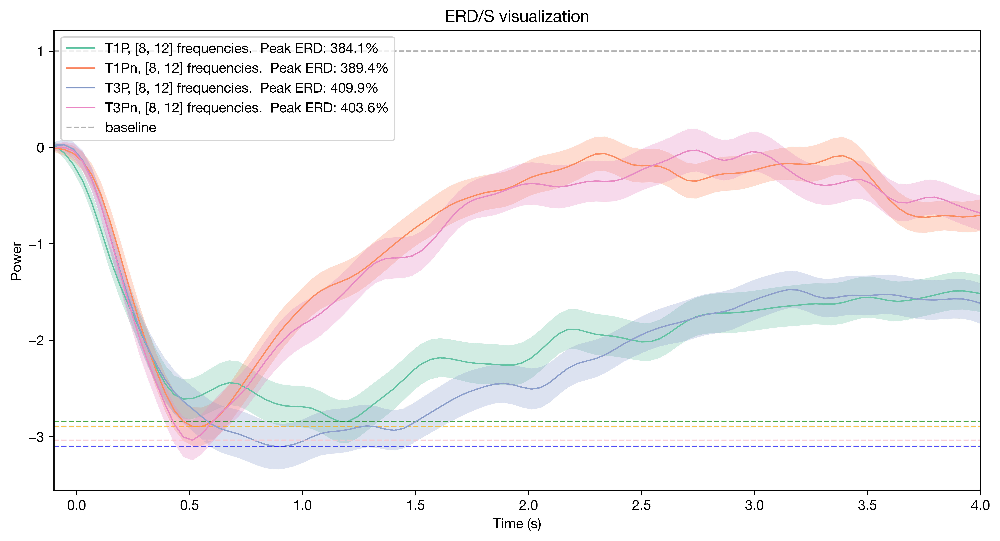

In [52]:
plot_TF(Alpha_psds, mean = True)

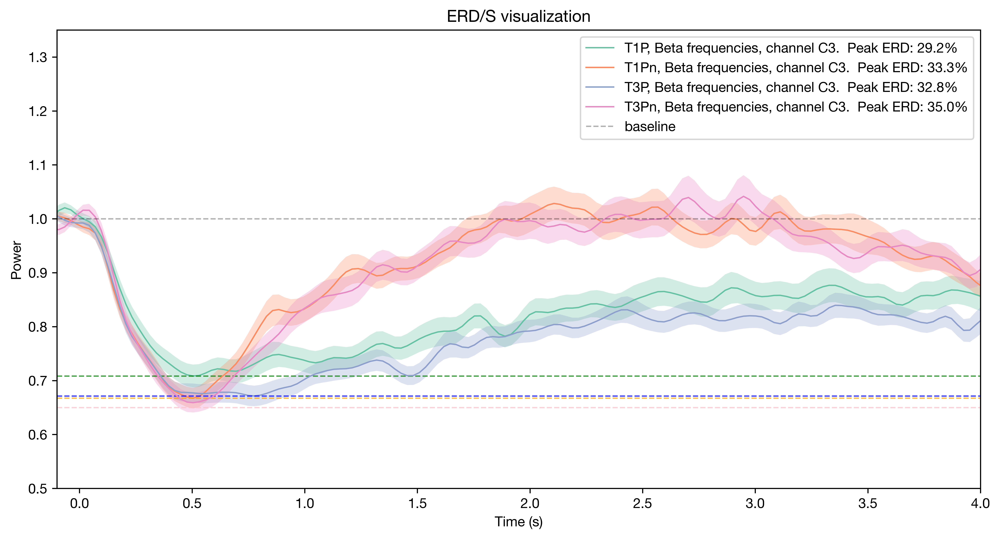

In [69]:
plot_TF(Beta_psds, mean = True)

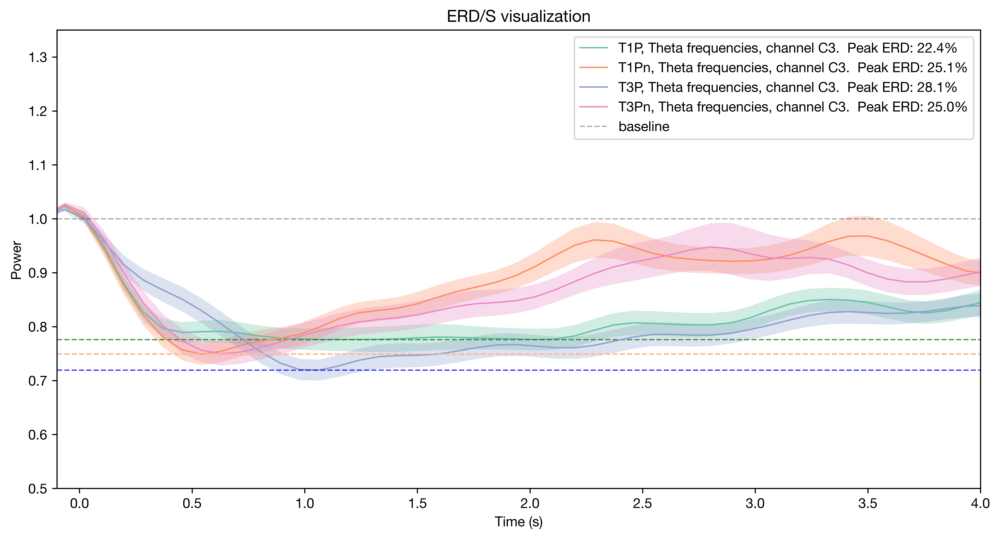

In [70]:
plot_TF(Theta_psds, mean = True)

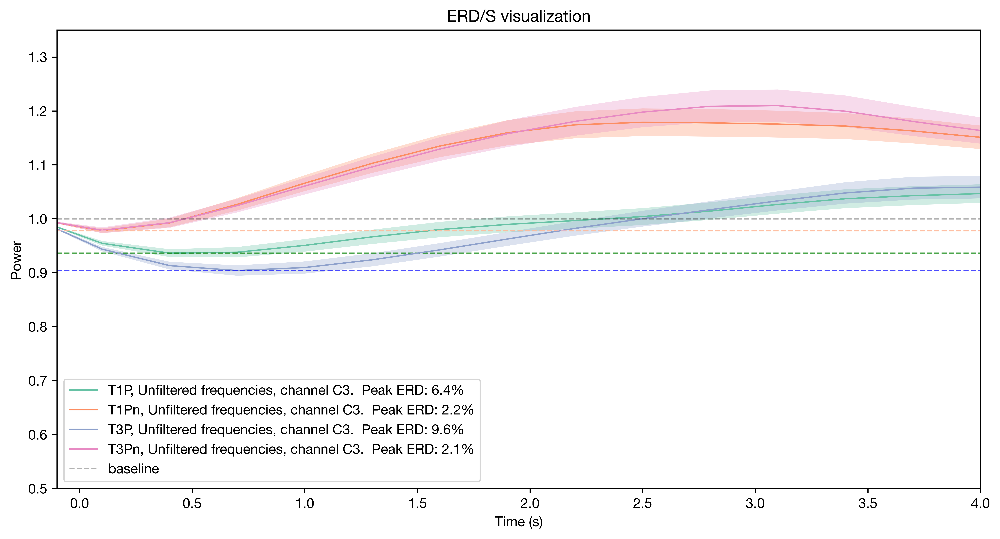

In [67]:
plot_TF(unfiltered_psds, mean = True)

In [ ]:
overlap = 0.9
settings = ['T1P']
channel = 'C3'
psds = get_psds_for_channel(participants_data=epochs_df.loc[epochs_df['Friend'] == 'Yes', 'Epochs'], channel=channel, settings=settings, band = [8,12], window=3/8, overlap = overlap)
F_psds = {'Friend, ' + old_key: old_value for old_key, old_value in psds.items()}
psds = get_psds_for_channel(participants_data=epochs_df.loc[epochs_df['Friend'] == 'No', 'Epochs'], channel=channel, settings=settings, band = [8,12], window=3/8, overlap = overlap)
nF_psds = {'Not friend, ' + old_key: old_value for old_key, old_value in psds.items()}
F_alpha = F_psds | nF_psds


For condition: T1P, for channel: C3 with freq band: [8, 12]:   0%|          | 0/62 [00:00<?, ?it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:   2%|▏         | 1/62 [00:06<06:48,  6.70s/it]

Loading data for 295 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:   3%|▎         | 2/62 [00:07<03:02,  3.04s/it]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:   5%|▍         | 3/62 [00:07<01:51,  1.89s/it]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:   6%|▋         | 4/62 [00:08<01:16,  1.32s/it]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:   8%|▊         | 5/62 [00:08<00:56,  1.00it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  10%|▉         | 6/62 [00:08<00:45,  1.24it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  11%|█▏        | 7/62 [00:09<00:42,  1.28it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  13%|█▎        | 8/62 [00:10<00:38,  1.42it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  15%|█▍        | 9/62 [00:10<00:33,  1.58it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  16%|█▌        | 10/62 [00:11<00:29,  1.75it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  18%|█▊        | 11/62 [00:11<00:26,  1.89it/s]

Loading data for 293 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  19%|█▉        | 12/62 [00:12<00:24,  2.04it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  21%|██        | 13/62 [00:12<00:22,  2.13it/s]

Loading data for 291 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  23%|██▎       | 14/62 [00:12<00:22,  2.16it/s]

Loading data for 284 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  24%|██▍       | 15/62 [00:13<00:21,  2.20it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  26%|██▌       | 16/62 [00:13<00:21,  2.19it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  27%|██▋       | 17/62 [00:14<00:20,  2.21it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  29%|██▉       | 18/62 [00:14<00:21,  2.08it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  31%|███       | 19/62 [00:15<00:20,  2.12it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  32%|███▏      | 20/62 [00:15<00:19,  2.15it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  34%|███▍      | 21/62 [00:16<00:18,  2.20it/s]

Loading data for 279 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  35%|███▌      | 22/62 [00:16<00:17,  2.27it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  37%|███▋      | 23/62 [00:16<00:17,  2.26it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  39%|███▊      | 24/62 [00:17<00:16,  2.27it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  40%|████      | 25/62 [00:17<00:16,  2.24it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  42%|████▏     | 26/62 [00:18<00:16,  2.24it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  44%|████▎     | 27/62 [00:18<00:15,  2.21it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  45%|████▌     | 28/62 [00:19<00:15,  2.21it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  47%|████▋     | 29/62 [00:19<00:14,  2.24it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  48%|████▊     | 30/62 [00:20<00:14,  2.27it/s]

Loading data for 290 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  50%|█████     | 31/62 [00:20<00:13,  2.29it/s]

Loading data for 293 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  52%|█████▏    | 32/62 [00:20<00:13,  2.27it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  53%|█████▎    | 33/62 [00:21<00:12,  2.33it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  55%|█████▍    | 34/62 [00:21<00:13,  2.09it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  56%|█████▋    | 35/62 [00:22<00:12,  2.11it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  58%|█████▊    | 36/62 [00:22<00:12,  2.15it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  60%|█████▉    | 37/62 [00:23<00:11,  2.21it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  61%|██████▏   | 38/62 [00:23<00:11,  2.16it/s]

Loading data for 290 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  63%|██████▎   | 39/62 [00:24<00:11,  2.06it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  65%|██████▍   | 40/62 [00:24<00:10,  2.05it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  66%|██████▌   | 41/62 [00:25<00:09,  2.10it/s]

Loading data for 282 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  68%|██████▊   | 42/62 [00:25<00:09,  2.15it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  69%|██████▉   | 43/62 [00:26<00:09,  2.07it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  71%|███████   | 44/62 [00:26<00:08,  2.02it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  73%|███████▎  | 45/62 [00:27<00:08,  2.01it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  74%|███████▍  | 46/62 [00:27<00:07,  2.08it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  76%|███████▌  | 47/62 [00:28<00:07,  2.13it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  77%|███████▋  | 48/62 [00:28<00:06,  2.15it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  79%|███████▉  | 49/62 [00:29<00:06,  2.05it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  81%|████████  | 50/62 [00:29<00:05,  2.11it/s]

Loading data for 274 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  82%|████████▏ | 51/62 [00:29<00:04,  2.22it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  84%|████████▍ | 52/62 [00:30<00:04,  2.15it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  85%|████████▌ | 53/62 [00:30<00:04,  2.18it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  87%|████████▋ | 54/62 [00:31<00:03,  2.24it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  89%|████████▊ | 55/62 [00:31<00:03,  2.26it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  90%|█████████ | 56/62 [00:32<00:02,  2.26it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  92%|█████████▏| 57/62 [00:32<00:02,  2.27it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  94%|█████████▎| 58/62 [00:33<00:01,  2.27it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  95%|█████████▌| 59/62 [00:33<00:01,  2.25it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  97%|█████████▋| 60/62 [00:33<00:00,  2.24it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  98%|█████████▊| 61/62 [00:34<00:00,  2.20it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]: 100%|██████████| 62/62 [00:34<00:00,  1.78it/s]
For condition: T3P, for channel: C3 with freq band: [8, 12]:   0%|          | 0/62 [00:00<?, ?it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:   2%|▏         | 1/62 [00:00<00:28,  2.16it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:   3%|▎         | 2/62 [00:00<00:29,  2.03it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:   5%|▍         | 3/62 [00:01<00:28,  2.09it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:   6%|▋         | 4/62 [00:01<00:27,  2.15it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:   8%|▊         | 5/62 [00:02<00:26,  2.19it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  10%|▉         | 6/62 [00:02<00:25,  2.22it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  11%|█▏        | 7/62 [00:03<00:24,  2.24it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  13%|█▎        | 8/62 [00:03<00:24,  2.24it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  15%|█▍        | 9/62 [00:04<00:23,  2.30it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  16%|█▌        | 10/62 [00:04<00:22,  2.33it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  18%|█▊        | 11/62 [00:04<00:22,  2.32it/s]

Loading data for 293 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  19%|█▉        | 12/62 [00:05<00:22,  2.21it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  21%|██        | 13/62 [00:05<00:21,  2.25it/s]

Loading data for 291 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  23%|██▎       | 14/62 [00:06<00:21,  2.22it/s]

Loading data for 284 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  24%|██▍       | 15/62 [00:06<00:20,  2.27it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  26%|██▌       | 16/62 [00:07<00:20,  2.27it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  27%|██▋       | 17/62 [00:07<00:20,  2.15it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  29%|██▉       | 18/62 [00:08<00:20,  2.14it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  31%|███       | 19/62 [00:08<00:20,  2.13it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  32%|███▏      | 20/62 [00:09<00:19,  2.16it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  34%|███▍      | 21/62 [00:09<00:18,  2.17it/s]

Loading data for 279 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  35%|███▌      | 22/62 [00:09<00:17,  2.24it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  37%|███▋      | 23/62 [00:10<00:17,  2.26it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  39%|███▊      | 24/62 [00:10<00:17,  2.23it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  40%|████      | 25/62 [00:11<00:16,  2.23it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  42%|████▏     | 26/62 [00:11<00:15,  2.26it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  44%|████▎     | 27/62 [00:12<00:15,  2.24it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  45%|████▌     | 28/62 [00:12<00:15,  2.21it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  47%|████▋     | 29/62 [00:13<00:14,  2.23it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  48%|████▊     | 30/62 [00:13<00:14,  2.15it/s]

Loading data for 290 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  50%|█████     | 31/62 [00:14<00:14,  2.21it/s]

Loading data for 293 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  52%|█████▏    | 32/62 [00:14<00:13,  2.22it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  53%|█████▎    | 33/62 [00:14<00:12,  2.27it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  55%|█████▍    | 34/62 [00:15<00:12,  2.26it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  56%|█████▋    | 35/62 [00:15<00:11,  2.26it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  58%|█████▊    | 36/62 [00:16<00:11,  2.28it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  60%|█████▉    | 37/62 [00:16<00:11,  2.25it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  61%|██████▏   | 38/62 [00:17<00:10,  2.27it/s]

Loading data for 290 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  63%|██████▎   | 39/62 [00:17<00:10,  2.26it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  65%|██████▍   | 40/62 [00:18<00:10,  2.18it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  66%|██████▌   | 41/62 [00:18<00:09,  2.20it/s]

Loading data for 282 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  68%|██████▊   | 42/62 [00:18<00:09,  2.20it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  69%|██████▉   | 43/62 [00:19<00:08,  2.13it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  71%|███████   | 44/62 [00:19<00:08,  2.13it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  73%|███████▎  | 45/62 [00:20<00:07,  2.14it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  74%|███████▍  | 46/62 [00:20<00:07,  2.14it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  76%|███████▌  | 47/62 [00:21<00:07,  2.14it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  77%|███████▋  | 48/62 [00:21<00:06,  2.15it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  79%|███████▉  | 49/62 [00:22<00:06,  2.15it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  81%|████████  | 50/62 [00:22<00:05,  2.12it/s]

Loading data for 274 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  82%|████████▏ | 51/62 [00:23<00:05,  2.14it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  84%|████████▍ | 52/62 [00:23<00:04,  2.10it/s]

Loading data for 297 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  85%|████████▌ | 53/62 [00:24<00:04,  2.09it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  87%|████████▋ | 54/62 [00:24<00:04,  1.97it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  89%|████████▊ | 55/62 [00:25<00:03,  2.06it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  90%|█████████ | 56/62 [00:25<00:03,  1.96it/s]

Loading data for 295 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  92%|█████████▏| 57/62 [00:26<00:02,  2.06it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  94%|█████████▎| 58/62 [00:26<00:01,  2.13it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  95%|█████████▌| 59/62 [00:27<00:01,  2.09it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  97%|█████████▋| 60/62 [00:27<00:00,  2.13it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  98%|█████████▊| 61/62 [00:27<00:00,  2.15it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]: 100%|██████████| 62/62 [00:28<00:00,  2.18it/s]
For condition: T1P, for channel: C3 with freq band: [8, 12]:   0%|          | 0/30 [00:00<?, ?it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:   3%|▎         | 1/30 [00:00<00:13,  2.21it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:   7%|▋         | 2/30 [00:00<00:13,  2.09it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  10%|█         | 3/30 [00:01<00:12,  2.12it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  13%|█▎        | 4/30 [00:01<00:11,  2.20it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  17%|█▋        | 5/30 [00:02<00:11,  2.23it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  20%|██        | 6/30 [00:02<00:10,  2.29it/s]

Loading data for 292 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  23%|██▎       | 7/30 [00:03<00:10,  2.28it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  27%|██▋       | 8/30 [00:03<00:10,  2.18it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  30%|███       | 9/30 [00:04<00:09,  2.13it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  33%|███▎      | 10/30 [00:04<00:09,  2.16it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  37%|███▋      | 11/30 [00:05<00:08,  2.17it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  40%|████      | 12/30 [00:05<00:09,  1.94it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  43%|████▎     | 13/30 [00:06<00:08,  2.00it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  47%|████▋     | 14/30 [00:06<00:07,  2.05it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  50%|█████     | 15/30 [00:07<00:07,  2.13it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  53%|█████▎    | 16/30 [00:07<00:06,  2.21it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  57%|█████▋    | 17/30 [00:08<00:07,  1.80it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  60%|██████    | 18/30 [00:08<00:06,  1.80it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  63%|██████▎   | 19/30 [00:09<00:06,  1.78it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  67%|██████▋   | 20/30 [00:09<00:05,  1.89it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  70%|███████   | 21/30 [00:10<00:04,  1.94it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  73%|███████▎  | 22/30 [00:10<00:04,  1.91it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  77%|███████▋  | 23/30 [00:11<00:03,  1.97it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  80%|████████  | 24/30 [00:11<00:02,  2.05it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  83%|████████▎ | 25/30 [00:12<00:02,  2.10it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  87%|████████▋ | 26/30 [00:12<00:01,  2.18it/s]

Loading data for 275 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  90%|█████████ | 27/30 [00:13<00:01,  2.27it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  93%|█████████▎| 28/30 [00:13<00:00,  2.32it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]:  97%|█████████▋| 29/30 [00:13<00:00,  2.34it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T1P, for channel: C3 with freq band: [8, 12]: 100%|██████████| 30/30 [00:14<00:00,  2.10it/s]
For condition: T3P, for channel: C3 with freq band: [8, 12]:   0%|          | 0/30 [00:00<?, ?it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:   3%|▎         | 1/30 [00:00<00:12,  2.39it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:   7%|▋         | 2/30 [00:00<00:12,  2.23it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  10%|█         | 3/30 [00:01<00:11,  2.31it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  13%|█▎        | 4/30 [00:01<00:11,  2.32it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  17%|█▋        | 5/30 [00:02<00:10,  2.31it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  20%|██        | 6/30 [00:02<00:10,  2.33it/s]

Loading data for 292 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  23%|██▎       | 7/30 [00:03<00:09,  2.32it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  27%|██▋       | 8/30 [00:03<00:09,  2.22it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  30%|███       | 9/30 [00:03<00:09,  2.21it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  33%|███▎      | 10/30 [00:04<00:09,  2.18it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  37%|███▋      | 11/30 [00:04<00:08,  2.22it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  40%|████      | 12/30 [00:05<00:07,  2.26it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  43%|████▎     | 13/30 [00:05<00:07,  2.29it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  47%|████▋     | 14/30 [00:06<00:06,  2.29it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  50%|█████     | 15/30 [00:06<00:06,  2.30it/s]

Loading data for 294 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  53%|█████▎    | 16/30 [00:07<00:05,  2.34it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  57%|█████▋    | 17/30 [00:07<00:05,  2.37it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  60%|██████    | 18/30 [00:07<00:05,  2.33it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  63%|██████▎   | 19/30 [00:08<00:04,  2.29it/s]

Loading data for 299 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  67%|██████▋   | 20/30 [00:08<00:04,  2.27it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  70%|███████   | 21/30 [00:09<00:04,  2.23it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  73%|███████▎  | 22/30 [00:09<00:03,  2.23it/s]

Loading data for 298 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  77%|███████▋  | 23/30 [00:10<00:03,  2.26it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  80%|████████  | 24/30 [00:10<00:02,  2.28it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  83%|████████▎ | 25/30 [00:11<00:02,  2.16it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  87%|████████▋ | 26/30 [00:11<00:01,  2.23it/s]

Loading data for 275 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  90%|█████████ | 27/30 [00:11<00:01,  2.30it/s]

Loading data for 289 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  93%|█████████▎| 28/30 [00:12<00:00,  2.32it/s]

Loading data for 296 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]:  97%|█████████▋| 29/30 [00:12<00:00,  2.32it/s]

Loading data for 300 events and 3000 original time points ...


For condition: T3P, for channel: C3 with freq band: [8, 12]: 100%|██████████| 30/30 [00:13<00:00,  2.28it/s]


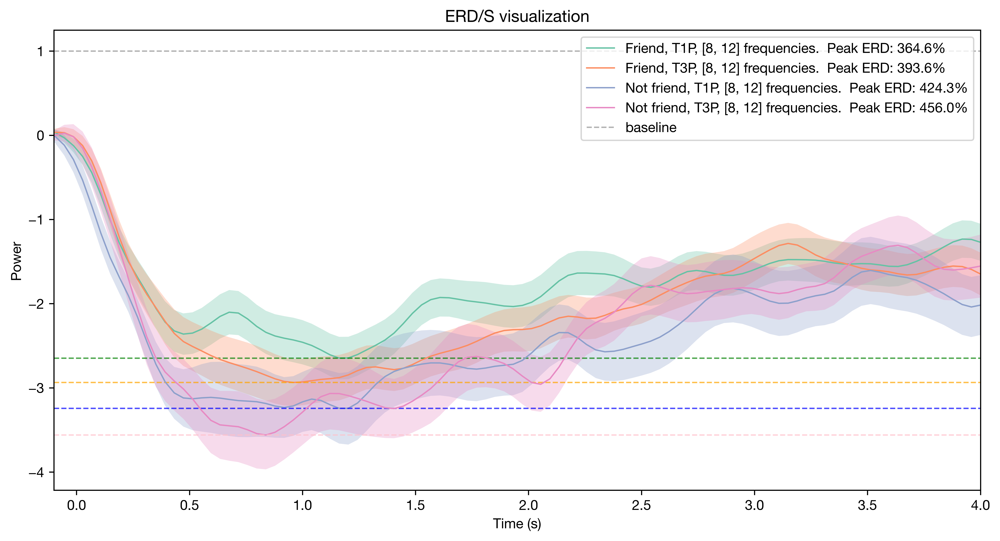

In [50]:
plot_TF(F_alpha, mean=True)

In [240]:
window = 1 # What should window size be?
overlap = 0.9
settings = ['T1P', 'T1Pn']
channel = 'C3'
psds = get_psds_for_channel_for_all_participants(participants_data=epochs_df.loc[epochs_df['Gender'] == 'M', 'Epochs'], channel=channel, settings=settings, freq_band = "Alpha", window=window, overlap = overlap)
M_psds = {'Male, ' + old_key: old_value for old_key, old_value in psds.items()}
psds = get_psds_for_channel_for_all_participants(participants_data=epochs_df.loc[epochs_df['Gender'] == 'F', 'Epochs'], channel=channel, settings=settings, freq_band = "Alpha", window=window, overlap = overlap)
F_psds = {'Female, ' + old_key: old_value for old_key, old_value in psds.items()}
FM_T1Ps_alpha = M_psds | F_psds
psds = get_psds_for_channel_for_all_participants(participants_data=epochs_df.loc[epochs_df['Gender'] == 'M', 'Epochs'], channel=channel, settings=settings, freq_band = "Theta", window=window, overlap = overlap)
M_psds = {'Male, ' + old_key: old_value for old_key, old_value in psds.items()}
psds = get_psds_for_channel_for_all_participants(participants_data=epochs_df.loc[epochs_df['Gender'] == 'F', 'Epochs'], channel=channel, settings=settings, freq_band = "Theta", window=window, overlap = overlap)
F_psds = {'Female, ' + old_key: old_value for old_key, old_value in psds.items()}
FM_T1Ps_Theta = M_psds | F_psds
psds = get_psds_for_channel_for_all_participants(participants_data=epochs_df.loc[epochs_df['Gender'] == 'M', 'Epochs'], channel=channel, settings=settings, freq_band = "Beta", window=window, overlap = overlap)
M_psds = {'Male, ' + old_key: old_value for old_key, old_value in psds.items()}
psds = get_psds_for_channel_for_all_participants(participants_data=epochs_df.loc[epochs_df['Gender'] == 'F', 'Epochs'], channel=channel, settings=settings, freq_band = "Beta", window=window, overlap = overlap)
F_psds = {'Female, ' + old_key: old_value for old_key, old_value in psds.items()}
FM_T1Ps_Beta = M_psds | F_psds

For condition: T1P, for channel: C3 with freq band: Alpha: 100%|██████████| 58/58 [00:45<00:00,  1.26it/s]
For condition: T1Pn, for channel: C3 with freq band: Alpha: 100%|██████████| 58/58 [00:32<00:00,  1.81it/s]
For condition: T1P, for channel: C3 with freq band: Alpha: 100%|██████████| 34/34 [00:19<00:00,  1.75it/s]
For condition: T1Pn, for channel: C3 with freq band: Alpha: 100%|██████████| 34/34 [00:18<00:00,  1.83it/s]
For condition: T1P, for channel: C3 with freq band: Theta: 100%|██████████| 58/58 [00:32<00:00,  1.78it/s]
For condition: T1Pn, for channel: C3 with freq band: Theta: 100%|██████████| 58/58 [00:31<00:00,  1.82it/s]
For condition: T1P, for channel: C3 with freq band: Theta: 100%|██████████| 34/34 [00:18<00:00,  1.82it/s]
For condition: T1Pn, for channel: C3 with freq band: Theta: 100%|██████████| 34/34 [00:18<00:00,  1.82it/s]
For condition: T1P, for channel: C3 with freq band: Beta: 100%|██████████| 58/58 [00:32<00:00,  1.80it/s]
For condition: T1Pn, for channel: 

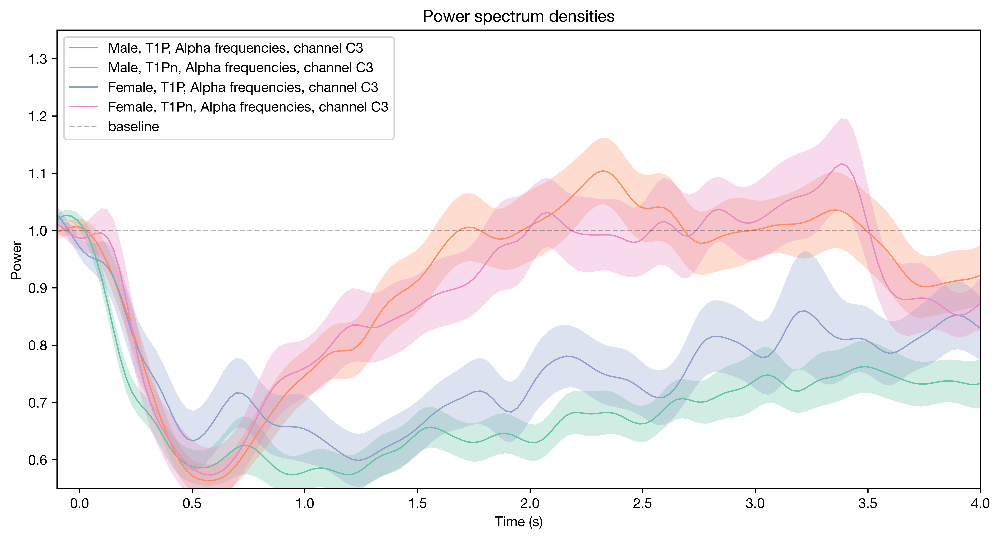

In [241]:
plot_TF(FM_T1Ps_alpha,mean=True)


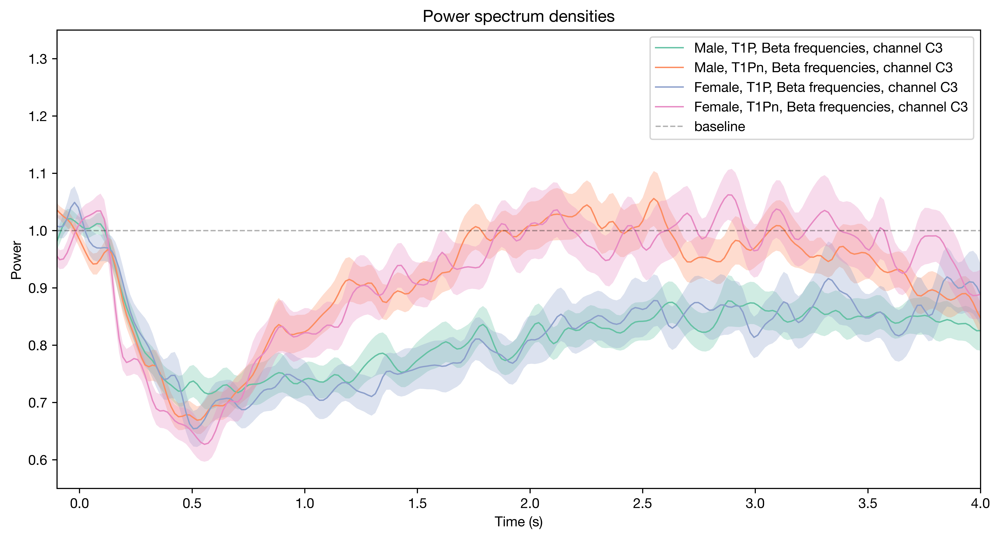

In [242]:
plot_TF(FM_T1Ps_Beta,mean=True)

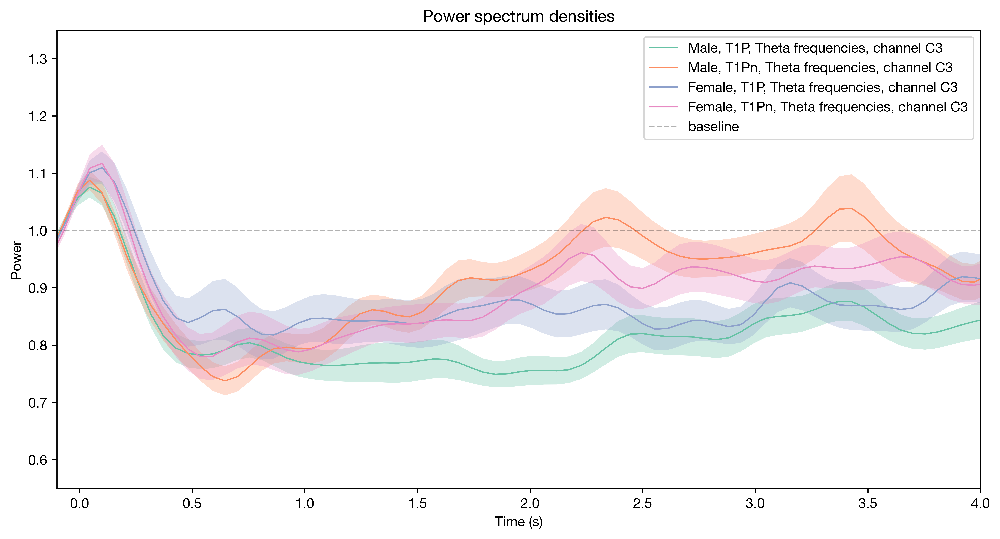

In [243]:
plot_TF(FM_T1Ps_Theta,mean=True)

In [ ]:
window = 1 # What should window size be?
overlap = 0.9
settings = ['T3P', 'T3Pn']
channel = 'C3'
psds = get_psds_for_channel_for_all_participants(participants_data=epochs_df.loc[epochs_df['Gender'] == 'M', 'Epochs'], channel=channel, settings=settings, freq_band = "Alpha", window=window, overlap = overlap)
M_psds = {'Male, ' + old_key: old_value for old_key, old_value in psds.items()}
psds = get_psds_for_channel_for_all_participants(participants_data=epochs_df.loc[epochs_df['Gender'] == 'F', 'Epochs'], channel=channel, settings=settings, freq_band = "Alpha", window=window, overlap = overlap)
F_psds = {'Female, ' + old_key: old_value for old_key, old_value in psds.items()}
FM_T3Ps_alpha = M_psds | F_psds
psds = get_psds_for_channel_for_all_participants(participants_data=epochs_df.loc[epochs_df['Gender'] == 'M', 'Epochs'], channel=channel, settings=settings, freq_band = "Theta", window=window, overlap = overlap)
M_psds = {'Male, ' + old_key: old_value for old_key, old_value in psds.items()}
psds = get_psds_for_channel_for_all_participants(participants_data=epochs_df.loc[epochs_df['Gender'] == 'F', 'Epochs'], channel=channel, settings=settings, freq_band = "Theta", window=window, overlap = overlap)
F_psds = {'Female, ' + old_key: old_value for old_key, old_value in psds.items()}
FM_T3Ps_Theta = M_psds | F_psds
psds = get_psds_for_channel_for_all_participants(participants_data=epochs_df.loc[epochs_df['Gender'] == 'M', 'Epochs'], channel=channel, settings=settings, freq_band = "Beta", window=window, overlap = overlap)
M_psds = {'Male, ' + old_key: old_value for old_key, old_value in psds.items()}
psds = get_psds_for_channel_for_all_participants(participants_data=epochs_df.loc[epochs_df['Gender'] == 'F', 'Epochs'], channel=channel, settings=settings, freq_band = "Beta", window=window, overlap = overlap)
F_psds = {'Female, ' + old_key: old_value for old_key, old_value in psds.items()}
FM_T3Ps_Beta = M_psds | F_psds

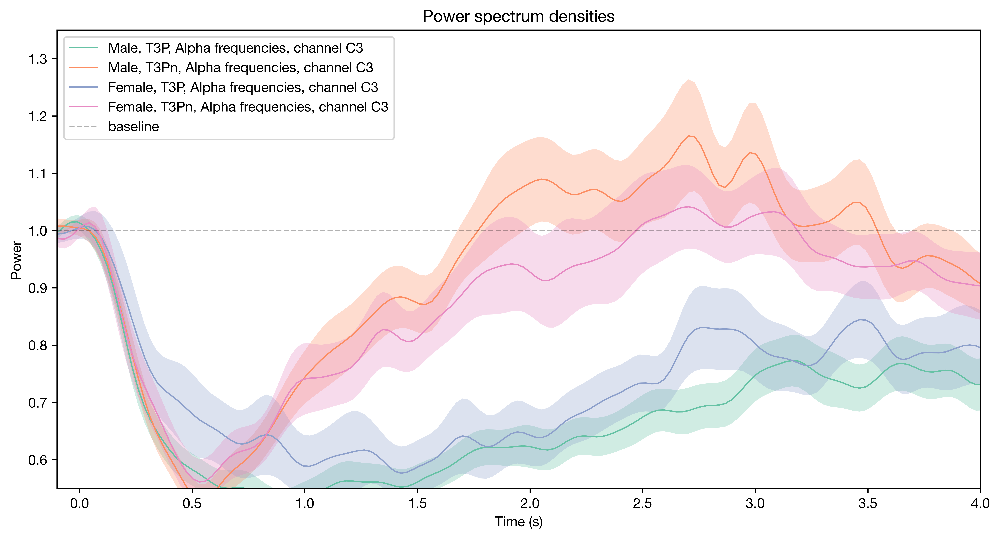

In [237]:
plot_TF(FM_T3Ps_alpha,mean=True)

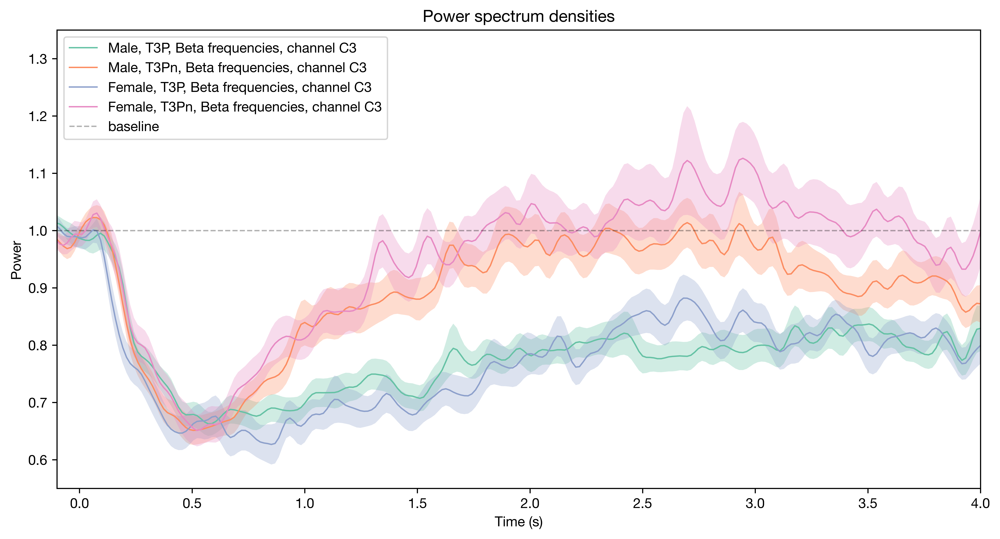

In [238]:
plot_TF(FM_T3Ps_Beta,mean=True)

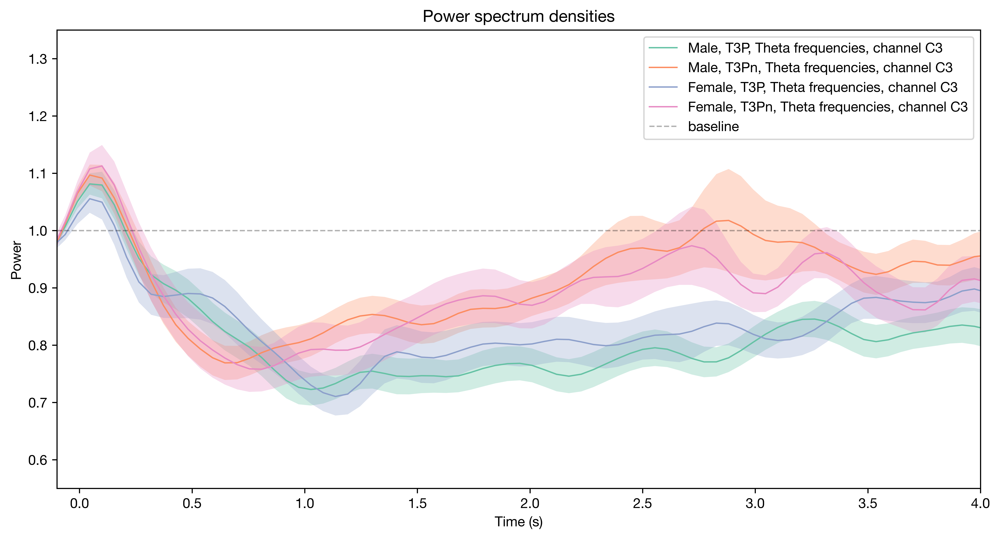

In [239]:
plot_TF(FM_T3Ps_Theta, mean = True)